In [1]:
import cv2
import numpy as np

### reading and saving images

In [ ]:
import cv2
import numpy as np

In [4]:
img = cv2.imread('./data/lena.jpg', -1)
cv2.imshow('img',img)
k = cv2.waitKey(0) & 0xFF
#if the escape key is hit it will close the window
#if the s key is hit it will save the image
if k == 27:
    cv2.destroyAllWindows()
elif k == ord('s'):
    cv2.imwrite('./data/lena_copy.png', img)
    cv2.destroyAllWindows()

### reading video live stream

In [7]:
cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    cv2.imshow('frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

### reading in webcam and converting it to gray

In [13]:
cap = cv2.VideoCapture(0)
print(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
while cap.isOpened():
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow('gray', gray)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

640.0
480.0


### writing a video

In [16]:
cap = cv2.VideoCapture(0)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('./data/output.avi', fourcc, 20.0, (640,480))
while cap.isOpened():
    ret, frame = cap.read()
    if ret == True:
        out.write(frame)
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        cv2.imshow('gray', gray)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

cap.release()
out.release()
cv2.destroyAllWindows()

### Drawing Geometric Shapes on Images

In [2]:
img = cv2.imread('./data/lena.jpg', 1)
#cv2.imshow('image', img)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [3]:
img.shape

(512, 512, 3)

In [4]:
#draw a line
#cv2.line(image, (starting point tuple), (ending poing tuple), (bgr tuple), thickness)
img = cv2.line(img, (0,0), (512,255), (147,96,44), 5)

#draw arrowed line
img = cv2.arrowedLine(img, (30,500), (75,50), (0,255,0), 2)

#draw a rectangle
#cv2.rectangle(img, (pt1 tuple), (pt2 tuple), (bgr color tuple), thickness)
img = cv2.rectangle(img, (80, 10), (150, 300), (255,0,0), 6) 
#(points 80 over 10 down to 100 over 300 down)
#-1 thickness will fill the rectangle with the color
img = cv2.rectangle(img, (80, 10), (150, 300), (0,0,0), -1) 

#draw a circle
#img = cv2.circle(img, (center as tuple), radius, (color bgr tuple), thickness)
img = cv2.circle(img, (255,255), 100, (0,0,128), 2)

#adding text to image
font = cv2.FONT_HERSHEY_SIMPLEX
#img = cv2.putText(img, string text, (start point of text), fontface, 
#fontscale, color, thickness, linetype)
img = cv2.putText(img, 'opencv', (10,500), font, 4, (128,128,128), 3, cv2.LINE_AA)


cv2.imshow('image',img)
cv2.waitKey(0)
cv2.destroyAllWindows()
#other things you draw are eclipse, polyline,polygon, etc 

### Create an image using numpy zeros

In [5]:
#really just creating a np array of zeros with the defined shape
#np.zeros([shape as a list], dtype)
img = np.zeros([512, 512, 3], np.uint8)
img = cv2.putText(img, 'opencv', (10,500), font, 4, (128,128,128), 3, cv2.LINE_AA)
cv2.imshow('image', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Add text to videos and change resolution of video output

In [13]:
cap = cv2.VideoCapture(0)
print(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

#able to set the cap properties (there are a lot of properties)
#property number 3 is width and 4 is height
cap.set(3, 1280)
cap.set(4, 720)
print(cap.get(3))
print(cap.get(4))

height = int(cap.get(4))
width = int(cap.get(3))
text = f'Width: {width}, Height: {height}'
font = cv2.FONT_HERSHEY_SIMPLEX

while cap.isOpened():
    ret,frame = cap.read()
    if ret == True:
        frame = cv2.putText(frame, text, (10,50), font, 1, (0,255,255), 1, cv2.LINE_AA)
        cv2.imshow('frame', frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
        
cap.release()
cv2.destroyAllWindows()

640.0
480.0
1280.0
720.0


### Print Date and Time on Video 

In [15]:

import datetime

cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret,frame = cap.read()
    if ret == True:
        font = cv2.FONT_HERSHEY_SIMPLEX
        #getting the time
        datet = str(datetime.datetime.now())
        #plugging to the time onto the frame
        frame = cv2.putText(frame, datet, (10,50), font, 1, (0,0,255), 1, cv2.LINE_AA)
        cv2.imshow('frame', frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
        
cap.release()
cv2.destroyAllWindows()

### Mouse Events in opencv

In [16]:
import numpy as np
import cv2

In [17]:
#here is a list of all mouse events available in cv2
events = [i for i in dir(cv2) if 'EVENT' in i]
print(events)

['EVENT_FLAG_ALTKEY', 'EVENT_FLAG_CTRLKEY', 'EVENT_FLAG_LBUTTON', 'EVENT_FLAG_MBUTTON', 'EVENT_FLAG_RBUTTON', 'EVENT_FLAG_SHIFTKEY', 'EVENT_LBUTTONDBLCLK', 'EVENT_LBUTTONDOWN', 'EVENT_LBUTTONUP', 'EVENT_MBUTTONDBLCLK', 'EVENT_MBUTTONDOWN', 'EVENT_MBUTTONUP', 'EVENT_MOUSEHWHEEL', 'EVENT_MOUSEMOVE', 'EVENT_MOUSEWHEEL', 'EVENT_RBUTTONDBLCLK', 'EVENT_RBUTTONDOWN', 'EVENT_RBUTTONUP']


In [9]:
#the goal of this code is the print the coordinates on the image when a left mouse click 
#and to print the BGR values onto the image when a right mouse click
def click_event(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        print(x, y)
        font = cv2.FONT_HERSHEY_SIMPLEX
        strXY = f'{x}, {y}'
        cv2.putText(img, strXY, (x, y), font, .5, (255,0,255), 1)
        cv2.imshow('image', img)
    if event == cv2.EVENT_RBUTTONDOWN:
        font = cv2.FONT_HERSHEY_SIMPLEX
        #not quite sure why img[y,x,band] instead of img[x,y,band]?
        #down comes first, then over second, then the band!
        #row first then column so y first then x
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        print(x,y)
        strBGR = f'{blue}, {green}, {red}'
        print(strBGR)
        cv2.putText(img, strBGR, (x, y), font, .5, (255,255,255), 1)
        cv2.imshow('image', img)

In [10]:
img = np.random.randint(0,255, size = [2,2,3],dtype = 'uint8')
img = cv2.resize(img, (512,512))
cv2.imshow('image',img)
cv2.setMouseCallback('image', click_event)

cv2.waitKey(0)
cv2.destroyAllWindows()

9 20
75, 198, 62
9 27
21 57
75, 198, 62
21 57
55 72


### Connecting Two Mouse Clicks with a Line

In [13]:
def click_event(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        cv2.circle(img, (x,y), 5, (128,128,255), -1)
        points.append((x,y))
        print(x,y)
        if len(points) >= 2:
            cv2.line(img, points[-2], points[-1], (50,255,255), 5)
        cv2.imshow('image', img)

        

img = np.random.randint(0,255, size = [512,512,3],dtype = 'uint8')
cv2.imshow('image',img)
points = []
cv2.setMouseCallback('image', click_event)

cv2.waitKey(0)
cv2.destroyAllWindows()

418 358
181 431
137 348
231 339
288 442
418 358
268 236
231 340
316 77


### Showing the color of the point clicked on a second window

In [25]:
import numpy as np
import cv2

def click_event(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        
        cv2.circle(img, (x,y), 3, (100,100,100), -1)
        mycolorImage = np.zeros((512,512,3), np.uint8)
        
        mycolorImage[:] = [blue, green, red]
        cv2.imshow('colorwindow', mycolorImage)

        

img = np.random.randint(0,255, size = [2,2,3],dtype = 'uint8')
img = cv2.resize(img, (512,512))
cv2.imshow('image',img)
points = []
cv2.setMouseCallback('image', click_event)

cv2.waitKey(0)
cv2.destroyAllWindows()

### Basic Operations in Images

In [1]:
import cv2
img = cv2.imread('./data/messi5.jpg', 1)

In [2]:
print(img.shape) #tuple of the (rows, columns, and channels)
print(img.size) #total number of pixels
print(img.dtype) #image datatype of the pixels

(342, 548, 3)
562248
uint8


In [3]:
b,g,r = cv2.split(img)
print(b,g,r)

[[39 42 44 ... 57 55 52]
 [37 42 46 ... 62 60 57]
 [41 46 51 ... 64 63 60]
 ...
 [56 48 49 ... 60 63 73]
 [54 59 50 ... 56 69 64]
 [45 58 71 ... 49 52 51]] [[ 43  46  47 ...  55  53  50]
 [ 40  45  49 ...  60  58  55]
 [ 45  50  55 ...  63  62  59]
 ...
 [143 133 129 ... 134 134 145]
 [138 141 130 ... 132 142 137]
 [129 140 151 ... 124 125 124]] [[ 44  47  52 ...  55  53  50]
 [ 44  49  54 ...  60  58  55]
 [ 50  55  60 ...  65  64  61]
 ...
 [ 99  89  86 ...  92  94 103]
 [ 96  99  87 ...  91 104  97]
 [ 87  98 108 ...  86  87  86]]


In [4]:
img = cv2.merge((b,g,r))
cv2.imshow('image', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [5]:
#copy the ball from the image and place it else on the image
ball = img[280:340,330:390] #extracts the ball
img[273:333, 100:160] = ball #sets the img coordinates to the pixel values of the ball variable

cv2.imshow('image', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [11]:
#merge two images together
img = cv2.imread('./data/messi5.jpg',1)
img = cv2.resize(img, (512,512))
img2 = cv2.imread('./data/opencv-logo.png',1)
img2 = cv2.resize(img2, (512,512))
#both images need to have the same size so we use cv2.resize() method
dst = cv2.add(img, img2)

cv2.imshow('dst', dst)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [22]:
#add weighted images
img
img2
dst = cv2.addWeighted(img, .75, img2, .25, 0)
cv2.imshow('dst', dst)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Bitwise Operators

In [35]:
#bitwise operators work well when working with masks

In [1]:
import cv2
import numpy as np

In [2]:
img1 = np.zeros((250,500,3), np.uint8) #create a black image
img1 = cv2.rectangle(img1, (200,0), (300,100), (255,255,255), -1) #adds a white rectangle to the black image
img2 = cv2.imread('./data/image_1.png', 1)

In [46]:
cv2.imshow('img1', img1)
cv2.imshow('img2', img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [47]:
#The Logic AND
#B A Q
#0 0 0
#0 1 0
#1 0 0
#1 1 1
#areas that are white in both images and be white in the new image
bitAnd = cv2.bitwise_and(img2, img1)
cv2.imshow('bitAnd', bitAnd)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [48]:
#The Logic OR
#B A Q
#0 0 0
#0 1 1
#1 0 1
#1 1 1
#Any area that is white will give white in the new image
bitOr = cv2.bitwise_or(img2, img1)
cv2.imshow('bitor', bitOr)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [53]:
#The Logic XOR
#B A Q
#0 0 0
#0 1 1
#1 0 1
#1 1 0
#A OR B but NOT BOTH gives Q
bitXOr = cv2.bitwise_xor(img2, img1)
cv2.imshow('bitxor', bitXOr)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [3]:
#The Logic NOT
#returns the oposite of the input
bitNot1 = cv2.bitwise_not(img1)
bitNot2 = cv2.bitwise_not(img2)
cv2.imshow('bitnot1', bitNot1)
cv2.imshow('bitnot2', bitNot2)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Trackbars

In [4]:
#usefull when you want to change a value in your image dynamically at runtime

In [2]:
import cv2
import numpy as np

In [7]:
def nothing(x):
    print(x)

img = np.zeros((300,512, 3), np.uint8)
cv2.namedWindow('image')

#creates the trackbars that allow us to change the values of B,G,R
cv2.createTrackbar('B', 'image', 0, 255, nothing)
cv2.createTrackbar('G', 'image', 0, 255, nothing)
cv2.createTrackbar('R', 'image', 0, 255, nothing)

switch = '0 : OFF\n 1: ON'
cv2.createTrackbar(switch, 'image', 0,1, nothing)

while(1):
    cv2.imshow('image', img)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
    
    #get the values of BGR from the trackbar
    b = cv2.getTrackbarPos('B','image')
    g = cv2.getTrackbarPos('G', 'image')
    r = cv2.getTrackbarPos('R', 'image')
    s = cv2.getTrackbarPos(switch, 'image')
    
    #if the switch is set to 0 it changes the image to all black
    if s == 0:
        img[:] = 0
    else:
        #set the values of BGR to the image. now the sliders will change the color on the image
        img[:] = [b,g,r]
    
cv2.destroyAllWindows()

1
2
3
4
5
8
10
15
19
28
34
42
60
68
78
92
101
109
116
120
123
131
134
136
137
139
141
143
151
154
159
160
1


In [1]:
import cv2
import numpy as np

In [2]:
#Another example of trackbars
def nothing(x):
    print(x)

cv2.namedWindow('image')
cv2.createTrackbar('CP', 'image', 100, 400, nothing)
switch = 'Color/Gray'
cv2.createTrackbar(switch, 'image', 0,1, nothing)

while(1):
    img = cv2.imread('./data/lena.jpg', 1)
    pos = cv2.getTrackbarPos('CP', 'image')
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img, str(pos), (50,150), font, 4, (0,0,255))
    
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
        
    s = cv2.getTrackbarPos(switch, 'image')
    if s == 0:
        pass
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    img = cv2.imshow('image', img)
cv2.destroyAllWindows()

101
103
105
115
119
126
141
146
154
160
169
180
183
187
193
195
196
201
202
203
204
206
207
210
211
213
216
219
221
222
223
225
228
229
231
233
235
239
240
241
242
245
246
247
248
250
251
254
255
256
257
259
260
261
1


### Object Detection Using HSV Color Space in images

In [5]:
#lets say we only want to detect a certain color of skittle from an image

In [2]:
import cv2
import numpy as np

In [3]:
def nothing(x):
    pass

In [4]:
#create a new window that will have the trackbar to adjust lower and upper hsv values
cv2.namedWindow('Tracking')
cv2.createTrackbar('LH', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('LS', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('LV', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('UH', 'Tracking', 255, 255, nothing)
cv2.createTrackbar('US', 'Tracking', 255, 255, nothing)
cv2.createTrackbar('UV', 'Tracking', 255, 255, nothing)


while True:
    frame = cv2.imread('./data/smarties.png',1)
    #convert image from bgr to hsv
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
    l_h = cv2.getTrackbarPos('LH', 'Tracking')
    l_s = cv2.getTrackbarPos('LS', 'Tracking')
    l_v = cv2.getTrackbarPos('LV', 'Tracking')
    u_h = cv2.getTrackbarPos('UH', 'Tracking')
    u_s = cv2.getTrackbarPos('US', 'Tracking')
    u_v = cv2.getTrackbarPos('UV', 'Tracking')
    
    #define threshold for blue color
    lower_bound = np.array([l_h, l_s, l_v])
    upper_bound = np.array([u_h, u_s, u_v])
    #blue balls should set lower_bound = np.array([104, 47, 51]) and upper_bound = np.array([132,255,255])
    #green balls should set lower_bound = np.array([62, 47,51]) and upper_bound = np.array([95,255,255])
    #red balls should set lower_bound = np.array([0,26,113]) and upper_bound = np.array([58,255,255])
    
    
    
    #create a mask between lower and upper bounds
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    
    #use bitwise_and to extract only the colors the vall between those pixel values
    res = cv2.bitwise_and(frame, frame, mask=mask)
    
    
    cv2.imshow('frame', frame)
    cv2.imshow('mask', mask)
    cv2.imshow('result', res)
    
    
    key = cv2.waitKey(1)
    if key == 27:
        break

        
cv2.destroyAllWindows()

### Object Tracking using HSV Color Space in Videos

In [ ]:
import cv2
import numpy as np

In [ ]:
def nothing(x):
    pass

In [5]:

cap = cv2.VideoCapture(0)


#create a new window that will have the trackbar to adjust lower and upper hsv values
cv2.namedWindow('Tracking')
cv2.createTrackbar('LH', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('LS', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('LV', 'Tracking', 0, 255, nothing)
cv2.createTrackbar('UH', 'Tracking', 255, 255, nothing)
cv2.createTrackbar('US', 'Tracking', 255, 255, nothing)
cv2.createTrackbar('UV', 'Tracking', 255, 255, nothing)


while True:
    _, frame = cap.read()
    
    
    #convert image from bgr to hsv
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
    l_h = cv2.getTrackbarPos('LH', 'Tracking')
    l_s = cv2.getTrackbarPos('LS', 'Tracking')
    l_v = cv2.getTrackbarPos('LV', 'Tracking')
    u_h = cv2.getTrackbarPos('UH', 'Tracking')
    u_s = cv2.getTrackbarPos('US', 'Tracking')
    u_v = cv2.getTrackbarPos('UV', 'Tracking')
    
    #define threshold for blue color
    lower_bound = np.array([l_h, l_s, l_v])
    upper_bound = np.array([u_h, u_s, u_v])
    #blue balls should set lower_bound = np.array([104, 47, 51]) and upper_bound = np.array([132,255,255])
    #green balls should set lower_bound = np.array([62, 47,51]) and upper_bound = np.array([95,255,255])
    #red balls should set lower_bound = np.array([0,26,113]) and upper_bound = np.array([58,255,255])
    
    
    
    #create a mask between lower and upper bounds
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    
    #use bitwise_and to extract only the colors the vall between those pixel values
    res = cv2.bitwise_and(frame, frame, mask=mask)
    
    
    cv2.imshow('frame', frame)
    cv2.imshow('mask', mask)
    cv2.imshow('result', res)
    
    
    key = cv2.waitKey(1)
    if key == 27:
        break

cap.release()        
cv2.destroyAllWindows()

### Thresholding on Images

In [12]:
#thresholding a popular segmenting technique to separate an object from its background
#involves comparing each pixel of an image with a predefined threshold value
#divides all the pixels of the input image into 2 groups
#first group is the pixels with intensity value lower than the threshold
#second group is the pixels with intensity value higher than the threshold

In [13]:
import cv2
import numpy as np

In [14]:
img = cv2.imread('./data/gradient.png', 0)

In [32]:
#binary threshold - values in original image with intensity > 127 get a value of 255 
#while pixels with intensity value < 127 get a new value of 0
_, thresh1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
#THRESH_BINARY_INV gives the inverse of the above. Sets high intensity values in original img to 0 
#and low intensity values in img to 255
_, thresh2 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
#Pixels below the threshold value will not be changed. Values above the threshold value will be
#set to that threshold value (75 in this case).
_, thresh3 = cv2.threshold(img, 75, 255, cv2.THRESH_TRUNC)
#sets any pixel below the threshold value to 0 while keeping the pixels above the threshold
#value at their original pixel values
_, thresh4 = cv2.threshold(img, 75, 255, cv2.THRESH_TOZERO)
#inverse of above. sets everything above the threshold to 0 while keeping the original 
#pixel values for everything below the threshold value
_,thresh5 = cv2.threshold(img, 75, 255, cv2.THRESH_TOZERO_INV)

cv2.imshow('image', img)
cv2.imshow('Thresh1', thresh1)
cv2.imshow('Thresh2', thresh2)
cv2.imshow('Thresh3', thresh3)
cv2.imshow('Thresh4', thresh4)
cv2.imshow('Thresh5', thresh5)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Adaptive Thresholding

In [34]:
#method where the threshold is calculated for a smaller region.
#there will be different threshold values for different regions of an image

#useful with different lighting conditions in different regions 

In [33]:
import cv2
import numpy as np

In [39]:
img = cv2.imread('./data/sudoku.png', 0)

In [40]:
#standard thresholding that produces bad results
_, thresh1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

#ADAPTIVE_THRESH_MEAN_C = mean of of the blocksize x blocksize neighborhoold of (x,y) minus c
#produces much better results
thresh2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

#ADAPTIVE_THRESH_GAUSSIAN_C = threshold value T(x, y) is a weighted sum of the blocksize x blocksize
#neighborhood of (x,y) minus c
#not much different from the one above. still way better than the first one
thresh3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

In [ ]:
cv2.imshow('img', img)
cv2.imshow('Thresh1', thresh1)
cv2.imshow('Thresh2', thresh2)
cv2.imshow('Thresh3', thresh3)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Matplotlib and OpenCV

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

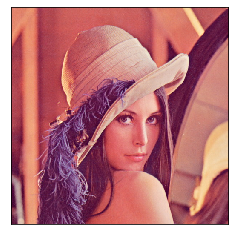

In [3]:
img = cv2.imread('./data/lena.jpg', -1)
cv2.imshow('image', img)

#plt returns an image in notebook using RGB color instead of BGR so the color of lena looks very blue
#so we need to convert it to RGB using cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
#plt.xticks([]), plt.yticks([])
plt.show()


cv2.waitKey(0)
cv2.destroyAllWindows()

In [4]:
#lets show the 6 threshold plots from above on a single matplotlib plot

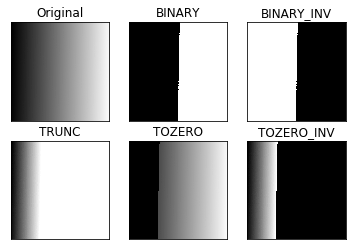

In [6]:
img = cv2.imread('./data/gradient.png', 0)

_, thresh1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
_, thresh2 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
_, thresh3 = cv2.threshold(img, 75, 255, cv2.THRESH_TRUNC)
_, thresh4 = cv2.threshold(img, 75, 255, cv2.THRESH_TOZERO)
_,thresh5 = cv2.threshold(img, 75, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original', 'BINARY', "BINARY_INV", "TRUNC", "TOZERO", "TOZERO_INV"]
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2, 3, i+1) #plt.subplots(number of rows, number of columns, index)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])


plt.show()

### Morphological Transformations in OpenCV

In [9]:
#erosion, dilation, opening, and closing.
#simple operations based on the image shape.
#normally performed on binary images.
#2 things are required: the original image and a kernel
#a kernel tells you how to change the value of any given pixel by combining it with different amounts of neightboring pixels

In [10]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

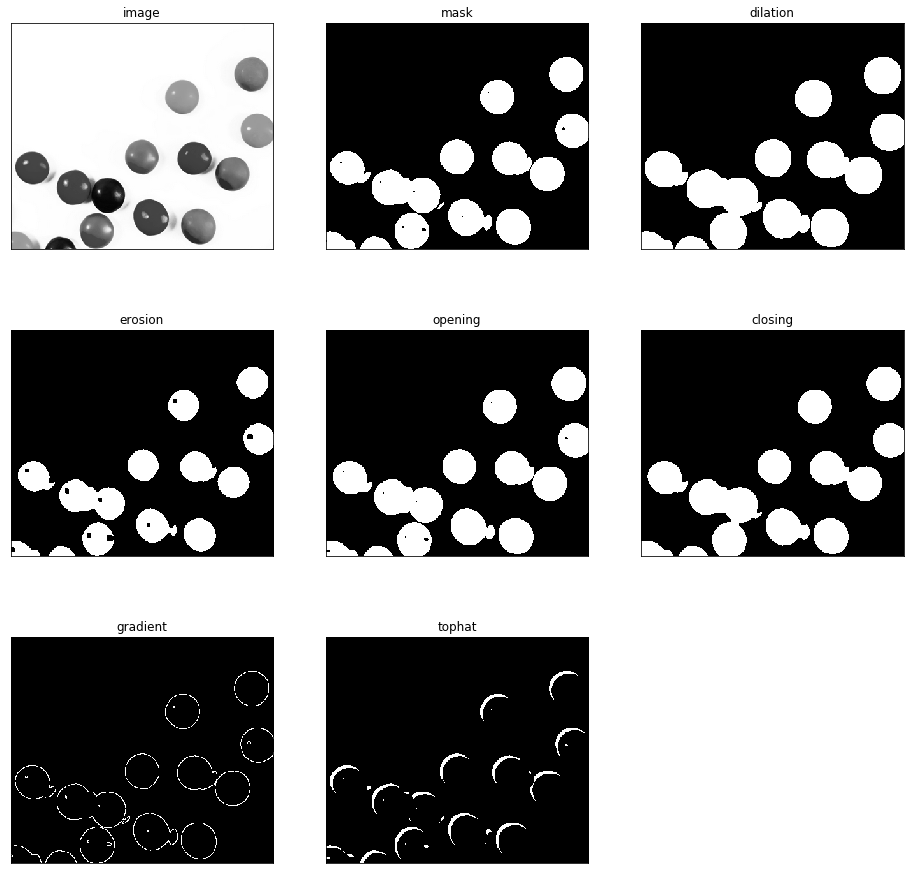

In [43]:
img = cv2.imread('./data/smarties.png', cv2.IMREAD_GRAYSCALE)
#since morphologic transformations are done on binary images we are going to create 
#a mask with simple binary threshold
_, mask = cv2.threshold(img, 220,255, cv2.THRESH_BINARY_INV)
#after the masking there a few black specks on the skittles that we want to remove.
#we will use dilation transformation
kernel = np.ones((2,2), np.uint8)
dilation = cv2.dilate(mask, kernel, iterations = 4)
#some of the black specks are removed but there still some that didn't get removed.
#this gets fixed if we increase the number of iterations or increase the size of rectangle.

kernel = np.ones((2,2), np.uint8)
erosion = cv2.erode(mask, kernel, iterations = 4)
#the sides of the balls have been eroded and the black specs from the mask
#have actually increased in size.
#it erodes away the boundary of the objects
#if all the pixels under the kernel are 1, the central pixel will remain 1.
#if any of hte pixels under the kernel are 0, the central pixel will change to 0.
#hypothetically we could use dilation to fill in the specks of the balls and then erode the outside
#of the balls to shrink them back to the same size as before the dilation

kernel = np.ones((2,2), np.uint8)
opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations = 4)
#a method of performing erosion followed by dilation of the image.

kernel = np.ones((2,2), np.uint8)
closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations = 4)
#closing performs the dilation first to fill in the gaps and then erosion to shrink the
#boundaries back to the size before dilation.
#this performs the best results as the balls are filled in but have not expanded in size 
#like what was seen in just the dilation.
kernel = np.ones((2,2), np.uint8)
gradient = cv2.morphologyEx(mask, cv2.MORPH_GRADIENT, kernel, iterations = 1)
#highlights pixels that have a sharp gradient to the next pixels
#the difference between dilation and erosion of an image?
tophat = cv2.morphologyEx(mask, cv2.MORPH_TOPHAT, kernel, iterations = 4)
#highlights pixels that have a gradient on the top part of the gradient but not on the bottom
#difference between an image and the opening of an image?

titles = ['image', 'mask', 'dilation', 'erosion', 'opening', 'closing', 'gradient', 'tophat']
images = [img, mask, dilation, erosion, opening, closing, gradient, tophat]

plt.figure(figsize=(16, 16)) 
for i in range(len(images)):
    plt.subplot(3,3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    

plt.show()

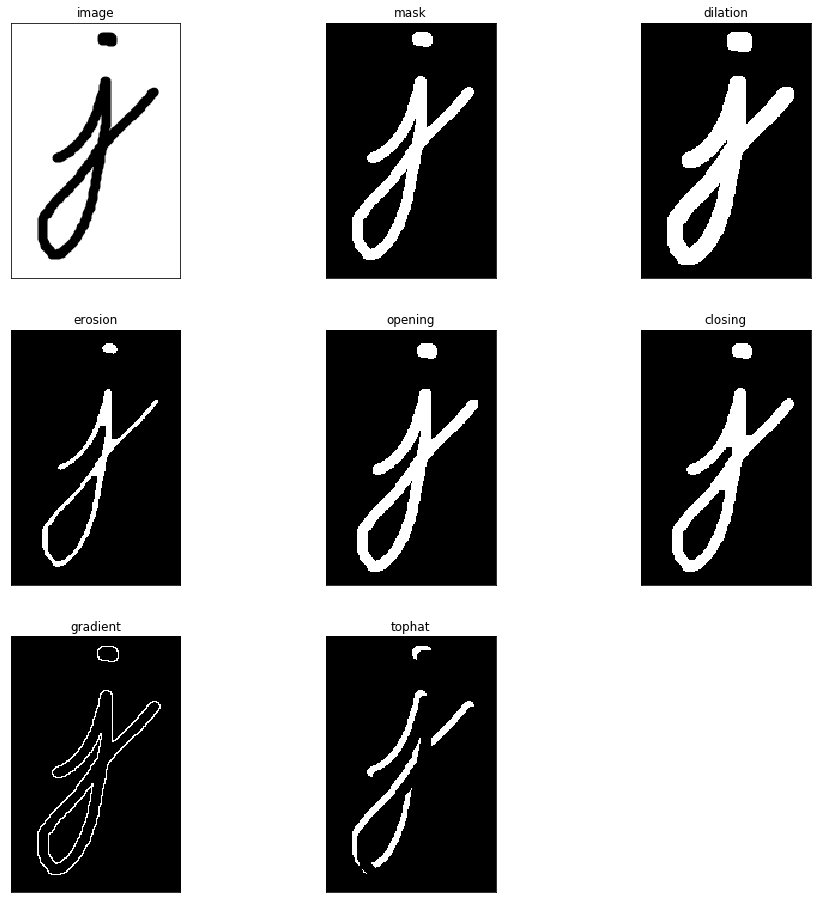

In [45]:
img = cv2.imread('./data/j.png', cv2.IMREAD_GRAYSCALE)
#since morphologic transformations are done on binary images we are going to create 
#a mask with simple binary threshold
_, mask = cv2.threshold(img, 220,255, cv2.THRESH_BINARY_INV)
#after the masking there a few black specks on the skittles that we want to remove.
#we will use dilation transformation
kernel = np.ones((2,2), np.uint8)
dilation = cv2.dilate(mask, kernel, iterations = 4)
#some of the black specks are removed but there still some that didn't get removed.
#this gets fixed if we increase the number of iterations or increase the size of rectangle.

kernel = np.ones((2,2), np.uint8)
erosion = cv2.erode(mask, kernel, iterations = 4)
#the sides of the balls have been eroded and the black specs from the mask
#have actually increased in size.
#it erodes away the boundary of the objects
#if all the pixels under the kernel are 1, the central pixel will remain 1.
#if any of hte pixels under the kernel are 0, the central pixel will change to 0.
#hypothetically we could use dilation to fill in the specks of the balls and then erode the outside
#of the balls to shrink them back to the same size as before the dilation

kernel = np.ones((2,2), np.uint8)
opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations = 4)
#a method of performing erosion followed by dilation of the image.

kernel = np.ones((2,2), np.uint8)
closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations = 4)
#closing performs the dilation first to fill in the gaps and then erosion to shrink the
#boundaries back to the size before dilation.
#this performs the best results as the balls are filled in but have not expanded in size 
#like what was seen in just the dilation.
kernel = np.ones((2,2), np.uint8)
gradient = cv2.morphologyEx(mask, cv2.MORPH_GRADIENT, kernel, iterations = 1)
#highlights pixels that have a sharp gradient to the next pixels
#the difference between dilation and erosion of an image?
tophat = cv2.morphologyEx(mask, cv2.MORPH_TOPHAT, kernel, iterations = 4)
#highlights pixels that have a gradient on the top part of the gradient but not on the bottom
#difference between an image and the opening of an image?

titles = ['image', 'mask', 'dilation', 'erosion', 'opening', 'closing', 'gradient', 'tophat']
images = [img, mask, dilation, erosion, opening, closing, gradient, tophat]

plt.figure(figsize=(16, 16)) 
for i in range(len(images)):
    plt.subplot(3,3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    

plt.show()

### Smoothing and Blurring Images

In [46]:
#blurring is one of the most commonly used techniques in image processing.
#used to remove noise in an image.
#various kinds of filters including Homogenous filter, Gaussian Filter, Median Filter, Bilateral Filter, etc.


In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

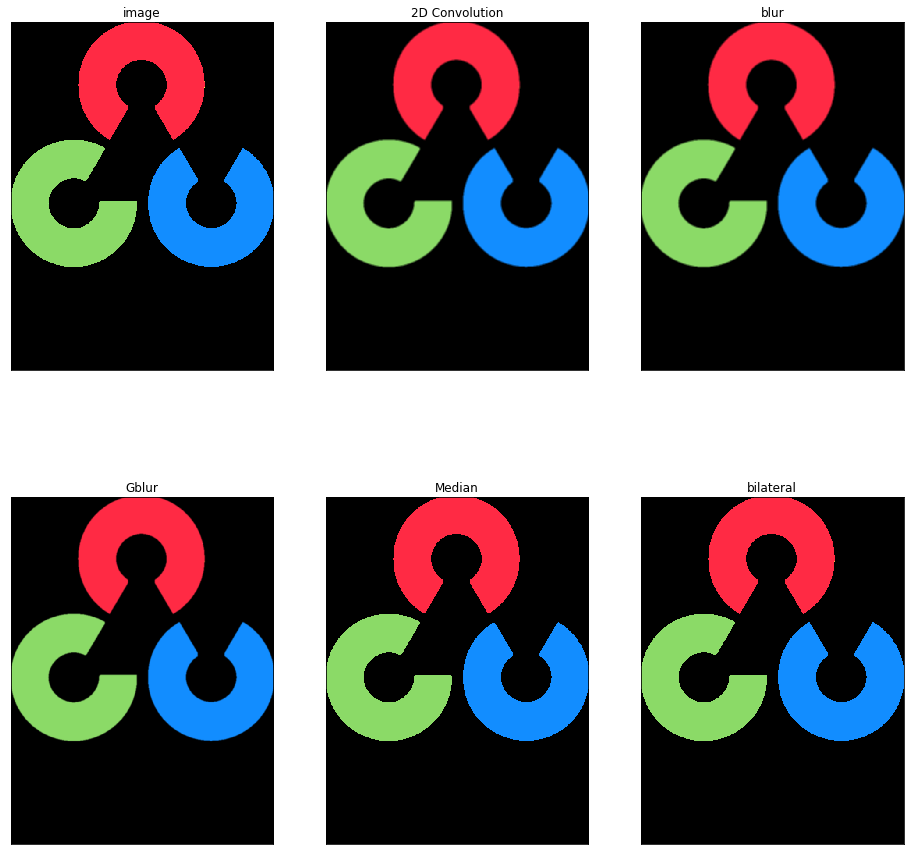

In [82]:
img = cv2.imread('./data/opencv-logo.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('./data/salt_and_pepper.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

#homegeneous filter is the most simple filter.
#each output pixel is the mean of its kernel neighbors
kernel = np.ones((5,5), np.float32)/25
dst = cv2.filter2D(img, -1, kernel)

#as in 1d signals, images can also be filtered with various low-pass filters, high-pass filters, etc
#low-pass helps in removing noise (blurring) while high pass helps in finding edges in the image
blur = cv2.blur(img, (5,5))

#Gaussian filter is just using different-weight-kernel, in both x and y direction
#1  4  6  4 1
#4 16 24 16 4
#6 24 36 24 6
#4 16 24 16 4
#1  4  6  4 1
gaus_blur = cv2.GaussianBlur(img, (5,5), 0)

#median filter replaces each pixel's value with the median of its neighboring pixels.
#this method is great when dealing with 'salt and pepper'
med_filter = cv2.medianBlur(img, 5)

#bilateral filter smooths the image but still keeps the edges sharp
bilateral = cv2.bilateralFilter(img, 9, 75, 75)



titles = ['image', '2D Convolution','blur', 'Gblur', 'Median', 'bilateral']
images = [img, dst, blur, gaus_blur, med_filter, bilateral]

plt.figure(figsize=(16, 16)) 
for i in range(len(images)):
    plt.subplot(2,3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()

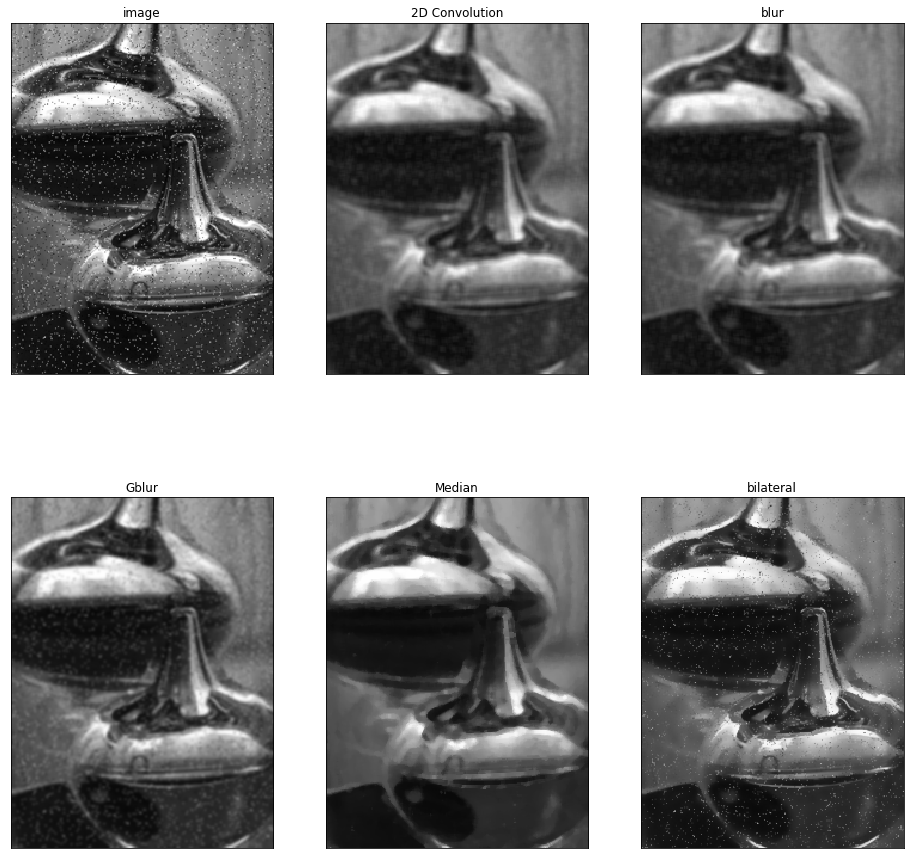

In [83]:
img2 = cv2.imread('./data/salt_and_pepper.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
kernel = np.ones((5,5), np.float32)/25
dst2 = cv2.filter2D(img2, -1, kernel)

#as in 1d signals, images can also be filtered with various low-pass filters, high-pass filters, etc
#low-pass helps in removing noise (blurring) while high pass helps in finding edges in the image
blur2 = cv2.blur(img2, (5,5))

#Gaussian filter is just using different-weight-kernel, in both x and y direction
#1  4  6  4 1
#4 16 24 16 4
#6 24 36 24 6
#4 16 24 16 4
#1  4  6  4 1
gaus_blur2 = cv2.GaussianBlur(img2, (5,5), 0)

#median filter replaces each pixel's value with the median of its neighboring pixels.
#this method is great when dealing with 'salt and pepper'
med_filter2 = cv2.medianBlur(img2, 5)

#bilateral filter smooths the image but still keeps the edges sharp
bilateral2 = cv2.bilateralFilter(img2, 9, 75, 75)



titles = ['image', '2D Convolution','blur', 'Gblur', 'Median', 'bilateral']
images = [img2, dst2, blur2, gaus_blur2, med_filter2, bilateral2]

plt.figure(figsize=(16, 16)) 
for i in range(len(images)):
    plt.subplot(2,3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()

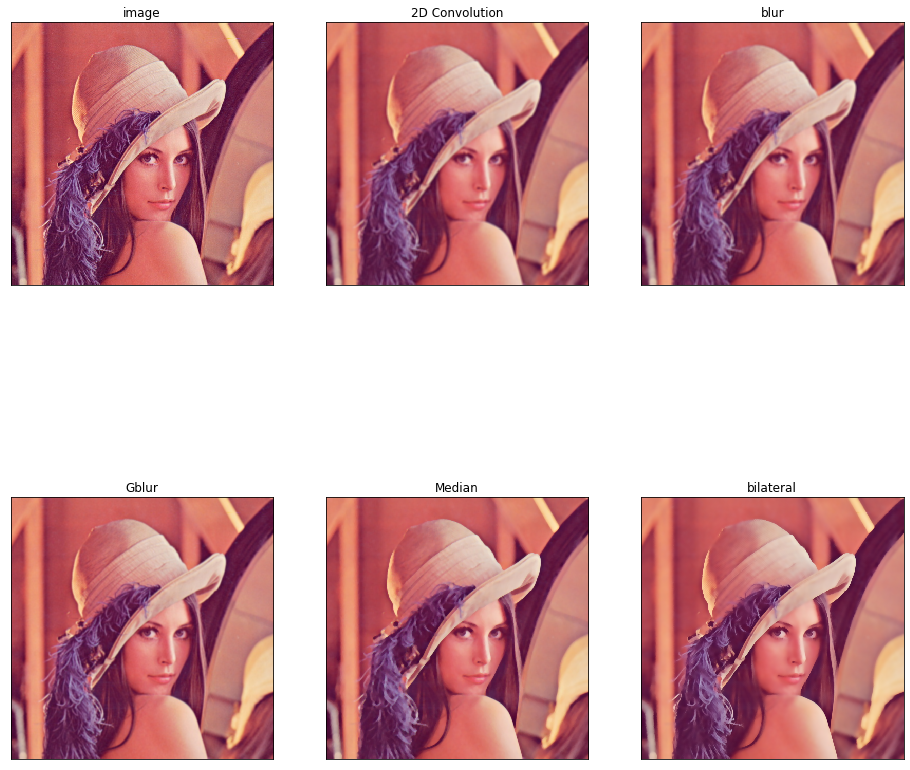

In [87]:
img3 = cv2.imread('./data/lena.jpg', -1)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

kernel = np.ones((5,5), np.float32)/25
dst3 = cv2.filter2D(img3, -1, kernel)

#as in 1d signals, images can also be filtered with various low-pass filters, high-pass filters, etc
#low-pass helps in removing noise (blurring) while high pass helps in finding edges in the image
blur3 = cv2.blur(img3, (5,5))

#Gaussian filter is just using different-weight-kernel, in both x and y direction
#1  4  6  4 1
#4 16 24 16 4
#6 24 36 24 6
#4 16 24 16 4
#1  4  6  4 1
gaus_blur3 = cv2.GaussianBlur(img3, (5,5), 0)

#median filter replaces each pixel's value with the median of its neighboring pixels.
#this method is great when dealing with 'salt and pepper'
med_filter3 = cv2.medianBlur(img3, 5)

#bilateral filter smooths the image but still keeps the edges sharp
bilateral3 = cv2.bilateralFilter(img3, 9, 75, 75)



titles = ['image', '2D Convolution','blur', 'Gblur', 'Median', 'bilateral']
images = [img3, dst3, blur3, gaus_blur3, med_filter3, bilateral3]

plt.figure(figsize=(16, 16)) 
for i in range(len(images)):
    plt.subplot(2,3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()

### Image gradients and Edge Detection

In [9]:
#an image gradient is a directional change in the intensity or color of an image
#gradients are used to find edges in an image
#https://docs.opencv.org/master/d5/d0f/tutorial_py_gradients.html
#Laplace, Sobel X, Sobel Y

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

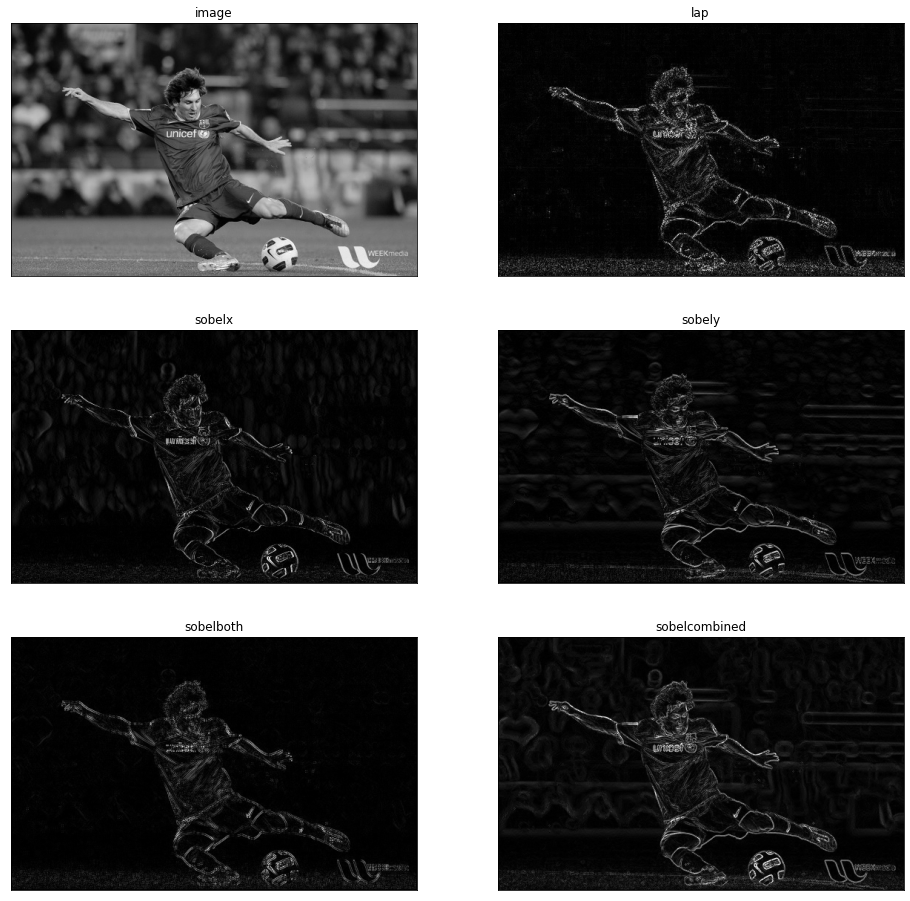

In [2]:
img = cv2.imread('./data/messi5.jpg', cv2.IMREAD_GRAYSCALE)

lap = cv2.Laplacian(img, cv2.CV_64F, ksize = 1)
lap = np.uint8(np.absolute(lap))

sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = 1)  #dx = 1 uses sobelx, dy = 1 uses sobely
sobelx = np.uint8(np.absolute(sobelx))

sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = 1)
sobely = np.uint8(np.absolute(sobely))

sobelboth = cv2.Sobel(img, cv2.CV_64F, 1,1, ksize = 1)
sobelboth = np.uint8(np.absolute(sobelboth))

sobelcombined = cv2.bitwise_or(sobelx, sobely)

titles = ['image','lap', 'sobelx', 'sobely', 'sobelboth', 'sobelcombined']
images = [img, lap, sobelx, sobely, sobelboth, sobelcombined]
plt.figure(figsize=(16, 16)) 
for i in range(len(titles)):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

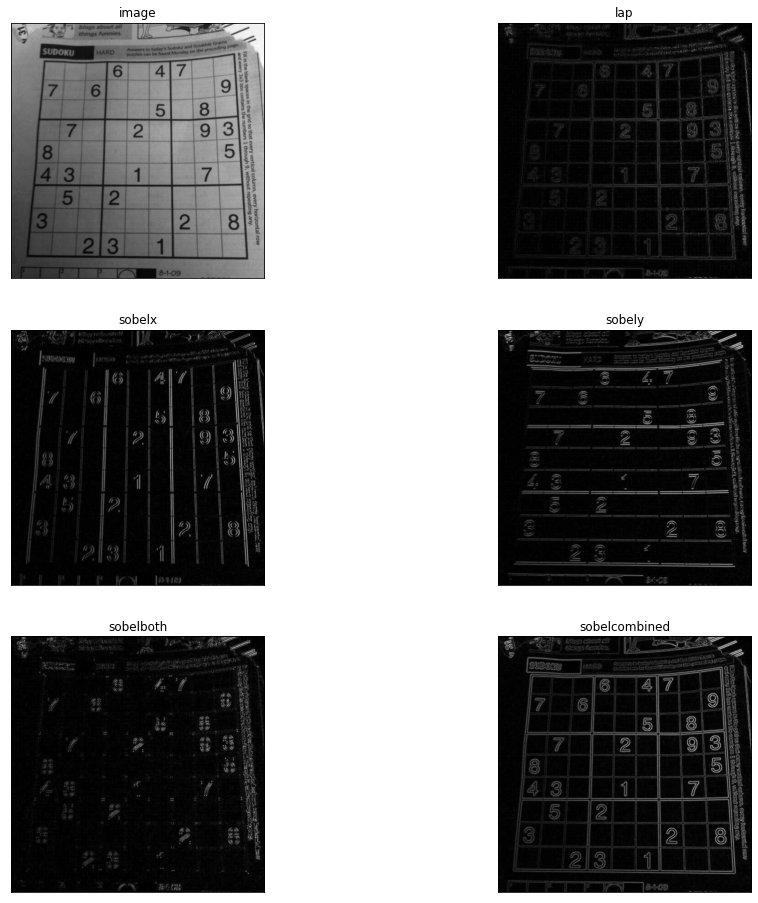

In [12]:
img = cv2.imread('./data/sudoku.png', cv2.IMREAD_GRAYSCALE)

lap = cv2.Laplacian(img, cv2.CV_64F, ksize = 1)
lap = np.uint8(np.absolute(lap))

sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = 1)  #dx = 1 uses sobelx, dy = 1 uses sobely
sobelx = np.uint8(np.absolute(sobelx))

sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = 1)
sobely = np.uint8(np.absolute(sobely))

sobelboth = cv2.Sobel(img, cv2.CV_64F, 1,1, ksize = 1)
sobelboth = np.uint8(np.absolute(sobelboth))

sobelcombined = cv2.bitwise_or(sobelx, sobely)

titles = ['image','lap', 'sobelx', 'sobely', 'sobelboth', 'sobelcombined']
images = [img, lap, sobelx, sobely, sobelboth, sobelcombined]

plt.figure(figsize=(16, 16)) 
for i in range(len(titles)):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i], cmap = 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

### Canny Edge Detection

In [16]:
#canny edge detector is an edge detection operator that uses a multi-stage algorithm to detect a wide range
#of edges in images. It was developed by John F. Canny in 1986

#Canny edge detection algorithm is composed of 5 steps
#1. Noise reduction (apply a gaussian filter to smooth image)
#2. Gradient Calculation (find intensity gradients of the image)
#3. Non-maximum suppression (get rid of spurious response to edge detection)
#4. Double Threshold (determine potential edges)
#5. Edge Tracking by Hysteresis (finalize edges by supressing all other edges that are weak or not connected)

#cv2.Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

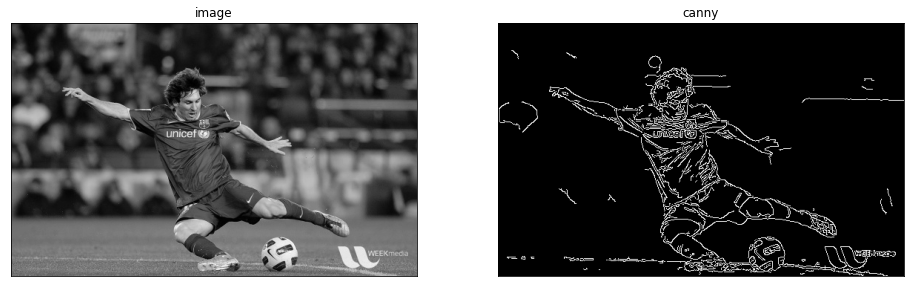

In [3]:
img = cv2.imread('./data/messi5.jpg', 0)

canny = cv2.Canny(img, 100, 200)

titles = ['image', 'canny']
images = [img, canny]
plt.figure(figsize=(16, 16)) 
for i in range(len(titles)):
    plt.subplot(1,2,i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

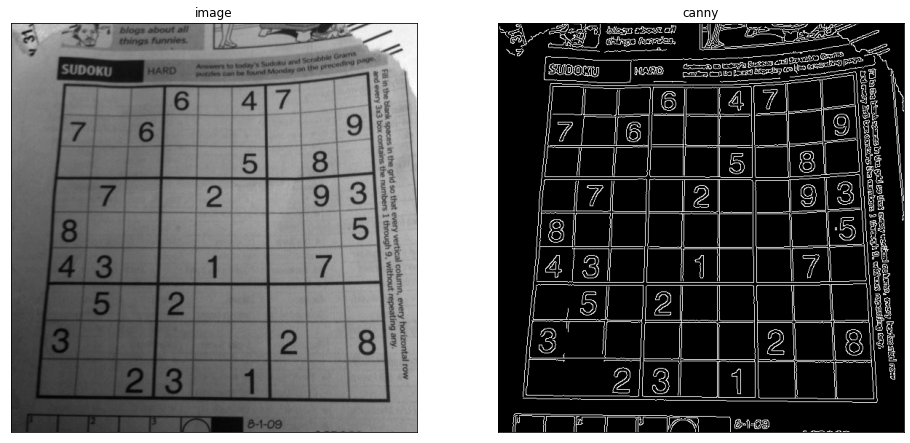

In [6]:
img = cv2.imread('./data/sudoku.png', 0)

canny = cv2.Canny(img, 50, 100)

titles = ['image', 'canny']
images = [img, canny]
plt.figure(figsize=(16, 16)) 
for i in range(len(titles)):
    plt.subplot(1,2,i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

In [2]:
import cv2
import numpy as np

In [3]:
def nothing(x):
    print(x)

cv2.namedWindow('image')
cv2.createTrackbar('Thresh1', 'image', 0, 1000, nothing)
cv2.createTrackbar('Thresh2', 'image', 0, 1000, nothing)
switch = 'On/Off'
cv2.createTrackbar(switch, 'image', 0,1, nothing)


while(1):
    img = cv2.imread('./data/messi5.jpg', 1)
    thresh1 = cv2.getTrackbarPos('Thresh1', 'image')
    thresh2 = cv2.getTrackbarPos('Thresh2', 'image')
     
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
        
    s = cv2.getTrackbarPos(switch, 'image')
    if s == 0:
        pass
    else:
        img = cv2.Canny(img, thresh1, thresh2)
    
    img = cv2.imshow('image', img)
cv2.destroyAllWindows()

1
3
6
8
11
14
17
20
23
25
28
31
34
37
39
45
48
56
65
70
87
101
113
121
132
135
138
141
146
149
152
155
158
161
163
166
169
172
175
177
180
183
186
192
200
206
208
214
217
220
223
225
231
239
242
245
248
251
256
259
273
276
282
290
293
296
299
301
304
307
313
315
318
321
327
330
332
335
338
341
344
346
349
352
355
358
361
363
366
372
377
383
386
389
394
397
403
406
411
414
417
420
423
425
428
431
434
437
442
448
454
456
459
462
470
476
482
487
490
493
496
499
501
504
507
510
513
515
518
521
524
527
530
532
538
546
552
555
558
555
552
549
546
541
538
532
527
524
521
518
515
513
510
507
504
501
499
496
493
490
487
485
482
479
476
473
470
468
465
462
459
456
454
451
448
445
442
437
434
431
428
425
423
420
417
411
408
406
403
400
389
383
375
369
363
358
352
344
338
332
330
324
318
313
304
299
296
290
287
279
276
270
265
259
254
248
242
237
234
231
225
223
220
214
211
206
203
200
197
194
197
206
208
214
220
225
231
234
239
245
254
256
262
268
270
273
279
282
285
287
290
293
296
299
301
304
3

### Image Pyramids

In [5]:
#sometimes we need to work with images of different resolutions
#pyramids is a type of multi-scale signal representation in which a signal or an image
#is subject to repeated smoothing and subsampling

#Two types of pyramids
#1. Gaussian pyramid - repeate filtering and subsampling of an image
#2. Laplacian pyramid - 

In [1]:
import cv2

In [11]:
img = cv2.imread('./data/lena.jpg')

#gaussian
lowres = cv2.pyrDown(img)  
lowres2 = cv2.pyrDown(lowres)  

highres = cv2.pyrUp(img)  
highres2 = cv2.pyrUp(lowres2)  #pyrup on a pyrdown makes a blurry image


cv2.imshow('original image', img)
cv2.imshow('pyrdown', lowres)
cv2.imshow('pyrdown2', lowres2)
cv2.imshow('pyrup', highres)
cv2.imshow('pyrup2', highres2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [16]:
#showing multiple layers of gaussian pyramid pyrDown
layer = cv2.imread('./data/lena.jpg',1)
gp = [layer]


for i in range(6):  #reduce resolution 5 times
    cv2.imshow(str(i), layer)
    layer = cv2.pyrDown(layer)
    gp.append(layer)
    


cv2.waitKey(0)
cv2.destroyAllWindows()

In [25]:
#laplacian pyramids
#a level in laplacian pyramid is formed by the difference between that level in gaussian pyramid and 
#expanded version of its upper level gaussian pyramid
#laplacian pyramid is formed by the difference between that level in the gaussian pyramid
#and expanded version of its upper level gaussian pyramid

import cv2
img = cv2.imread('./data/lena.jpg')
layer = img.copy()

gp = [layer]

for i in range(6):
    layer = cv2.pyrDown(layer)
    gp.append(layer)
    

last_image = gp[5]
lp = [layer]

for i in range(5,0,-1):
    gaussian_extended = cv2.pyrUp(gp[i])
    laplacian = cv2.subtract(gp[i-1], gaussian_extended)
    cv2.imshow(str(i), laplacian)
    

cv2.imshow('original', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


### Image Blending Using Pyramids

In [1]:
import cv2
import numpy as np

In [2]:
apple = cv2.imread('./data/apple.jpg')
orange = cv2.imread('./data/orange.jpg')
print(apple.shape)
print(orange.shape)

(512, 512, 3)
(512, 512, 3)


In [6]:
#half and half method
apple_orange = np.hstack((apple[:, :256], orange[:, 256:]))
#cuts each image in half and merged the two halfs together. 
# it works but it has a sharp ege between the two halves.

In [7]:
#blending method using image pyramids
#five steps required to blend with pyramids
#1. load the two images 
#2. find the gaussian pyramds for apple and orange (we will use 6 pyramids)
#3. from gaussian pyramids, find their laplacian pyramids
#4. now joing the left half and right half in each level of laplacian pyramids
#5. finally, from this join image pypramids, reconstruct the origianl image.

#1.
apple = cv2.imread('./data/apple.jpg')
orange = cv2.imread('./data/orange.jpg')

#2.
apple_copy = apple.copy()
gp_apple = [apple_copy]
for i in range(6):
    apple_copy = cv2.pyrDown(apple_copy)
    gp_apple.append(apple_copy)

orange_copy = orange.copy()
gp_orange = [orange_copy]
for i in range(6):
    orange_copy = cv2.pyrDown(orange_copy)
    gp_orange.append(orange_copy)
    
#3.
apple_copy = gp_apple[5]
lp_apple = [apple_copy]
for i in range(5,0,-1):
    gaussian_extended = cv2.pyrUp(gp_apple[i])
    laplacian = cv2.subtract(gp_apple[i-1], gaussian_extended)
    lp_apple.append(laplacian)
    
orange_copy = gp_orange[5]
lp_orange = [orange_copy]
for i in range(5,0,-1):
    gaussian_extended = cv2.pyrUp(gp_orange[i])
    laplacian = cv2.subtract(gp_orange[i-1], gaussian_extended)
    lp_orange.append(laplacian)
    
#4.
apple_orange_pyramid = []
n = 0
for apple_lap, orange_lap in zip(lp_apple, lp_orange):
    n += 1
    cols, rows, ch = apple_lap.shape
    laplacian = np.hstack((apple_lap[:,0:int(cols/2)], orange_lap[:,int(cols/2):]))
    apple_orange_pyramid.append(laplacian)
    
#5.
apple_orange_reconstruct = apple_orange_pyramid[0]
for i in range(1,6):
    apple_orange_reconstruct = cv2.pyrUp(apple_orange_reconstruct)
    apple_orange_reconstruct = cv2.add(apple_orange_pyramid[i], apple_orange_reconstruct)

In [8]:
cv2.imshow('apple', apple)
cv2.imshow('orange', orange)
cv2.imshow('apple_orange', apple_orange)
cv2.imshow('ao reconstruct', apple_orange_reconstruct)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Find and Draw Contours

In [14]:
#curve that follows pixels that have the same color or intensity
#useful for shape analysis, object detection, or object recognition
#better results when using binary images so we turn it from color to gray

In [1]:
import cv2
import numpy as np

In [2]:
img = cv2.imread('./data/opencv-logo.png')
imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [3]:
#threshold(src, thresh, maxval, type[, dst])
ret, thresh = cv2.threshold(imgray, 20, 255, 0)
#findContours(image, mode, method[, contours[, hierarchy[, offset]]])
contours, heirarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
#contrours is a python list of all the contours in the image
#each individual contour is a np array of (x,y) coordinates of boundary points of the object
#heirarchy is optional output vector containing information about image topology 

print('number of contours:', str(len(contours)))

number of contours: 4


In [4]:
#drawContours(image, contours, index of contour, color[, thickness[, lineType[, hierarchy[, maxLevel[, offset]]]]])
cv2.drawContours(img, contours, -1, (0,0,255), 3)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [5]:
cv2.imshow('image', img)
cv2.imshow('image gray', imgray)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Basic Motion Detection and Tracking

In [1]:
import cv2
import numpy as np

In [23]:
cap = cv2.VideoCapture('./data/vtest.avi')

In [24]:
ret,frame1 = cap.read()
ret,frame2 = cap.read()

In [25]:
while cap.isOpened():
    #find the difference between frame 1 and frame 2
    #absdiff(src1, src2[, dst])
    diff = cv2.absdiff(frame1, frame2)
    #convert the difference to a grayscale
    gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    #blur the grayscale frame
    #GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]])
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    #find the threshold
    #threshold(src, thresh, maxval, type[, dst])
    _, thresh = cv2.threshold(blur, 20, 255, cv2.THRESH_BINARY)
    #dilate the thresholded image to fill in all the holes to help us better find the contours
    #dilate(src, kernel[, dst[, anchor[, iterations[, borderType[, borderValue]]]]])
    dilated = cv2.dilate(thresh, None, iterations = 3)
    #find the contours
    #findContours(image, mode, method[, contours[, hierarchy[, offset]]])
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    #iterate over the contours
    for contour in contours:
        #find the bounding box around each contour
        (x, y, w, h) = cv2.boundingRect(contour)
        
        #find the area of the contour and remove contours with a small area
        if cv2.contourArea(contour) < 900:
            continue
        #if contour has area greater than 700px we will draw a rectangle around it
        #rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
        cv2.rectangle(frame1, (x,y), (x+w, y+h), (0,255,0), 2)
        #print message on the screen if there is movement
        cv2.putText(frame1, 'Movement Found', (10,20), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 3)
    
    cv2.imshow('feed', frame1)
    #set frame 2 to frame 1 and read in a new frame 2
    frame1 = frame2
    #reading the new frame into frame2
    ret, frame2 = cap.read()
    if cv2.waitKey(40) == 27:
        break
    
cv2.destroyAllWindows()
cap.release()

### Shape Detection

In [53]:
#detect what shape something is and write the name of the shape on the image
import cv2
import numpy as np

In [63]:
img = cv2.imread('./data/shapes.jpg')
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [64]:
#find the threshold
#threshold(src, thresh, maxval, type[, dst])
_, thresh = cv2.threshold(imgGray, 207, 255, cv2.THRESH_BINARY)
#find the contours
#findContours(image, mode, method[, contours[, hierarchy[, offset]]])
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
#iterate over all the contours
for contour in contours:
    #approximates a curve or a polygon with another curve/polygon with less 
    #vertices so that the distance between them is less or equal to the specified precision.
    #approxPolyDP(curve, epsilon, closed[, approxCurve])
    #arcLength(curve, closed)
    approx = cv2.approxPolyDP(contour, 0.01 * cv2.arcLength(contour, True), True)
    #draw the contours
    #drawContours(image, contours, contourIdx, color[, thickness[, lineType[, hierarchy[, maxLevel[, offset]]]]])
    
    cv2.drawContours(img, [approx], 0, (0,0,0), 3)
    #find the x,y coords of each shape where we will print the text
    x = approx.ravel()[0]
    y = approx.ravel()[1]
    #approximate the number of curves based on the approx variable
    if len(approx) == 3:
        cv2.putText(img, 'Triangle', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127))
    
    elif len(approx) == 4:
        x1, y1, w1, h1 = cv2.boundingRect(approx)
        aspect_ratio = float(w1) / h1
        if aspect_ratio >= 0.85 and aspect_ratio <= 1.15:
            cv2.putText(img, 'Square', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127)) 
        else:
            cv2.putText(img, 'Rectangle', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127)) 
    
    elif len(approx) == 5:
        cv2.putText(img, 'Pentagon', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127))       
    
    elif len(approx) == 10:
        cv2.putText(img, 'Star', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127)) 
    else:
        cv2.putText(img, 'Circle', (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (127,127,127))       
    



In [65]:
cv2.imshow('shapes', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Understanding Image Histograms

In [95]:
#the histogram provides information about contrast, intensity distribution, etc


In [70]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

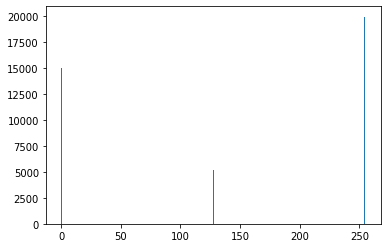

In [96]:
img = np.zeros((200,200), np.uint8)
cv2.rectangle(img, (0,100), (200, 200), (255), -1)
cv2.rectangle(img, (0,50), (100,100), (127), -1)
plt.hist(img.ravel(), bins = 255, range = (0,255))
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

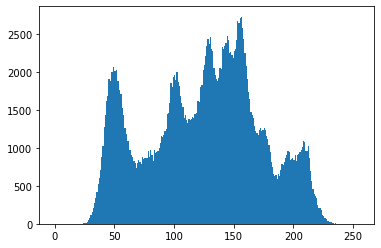

In [94]:
#grayscale image of lena
img = cv2.imread('./data/lena.jpg', 0)
plt.hist(img.ravel(), bins = 255, range = (0,255))
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

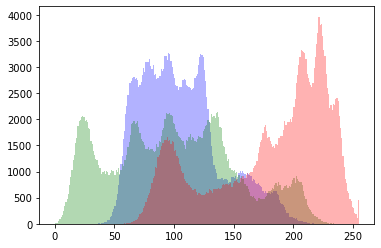

In [105]:
#histogram for a specific band of an image
img = cv2.imread('./data/lena.jpg', 1)
b,g,r = cv2.split(img)
plt.hist(b.ravel(), bins = 255, range = (0,255), color = 'blue', alpha = .3)
plt.hist(g.ravel(), bins = 255, range = (0,255), color = 'green',alpha = .3)
plt.hist(r.ravel(), bins = 255, range = (0,255), color = 'red',alpha = .3)
cv2.imshow('b', b)
cv2.imshow('g', g)
cv2.imshow('r', r)
cv2.waitKey(0)
cv2.destroyAllWindows()

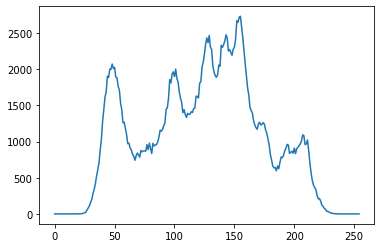

In [109]:
#also a method in cv2 that shows a histogram
img = cv2.imread('./data/lena.jpg', 0)
#calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])
hist = cv2.calcHist([img], [0], None, [255], [0,256])
plt.plot(hist)
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [115]:
#the hist can tell you if the image was properly exposed, if the lighting conditions were harsh,
#and allows you to make adjustments to make your image look the best

### Template Matching

In [1]:
#method of searching and finding the location of a template image inside a larger image
#https://docs.opencv.org/master/d4/dc6/tutorial_py_template_matching.html
#https://docs.opencv.org/3.4/de/da9/tutorial_template_matching.html
#cv2.matchTemplate(image, templ, method[, result[, mask]])
#several methods
#cv.TM_CCOEFF
#cv.TM_CCOEFF_NORMED
#cv.TM_CCORR
#cv.TM_CCORR_NORMED
#cv.TM_SQDIFF
#cv.TM_SQDIFF_NORMED

In [35]:
import cv2
import numpy as np

In [63]:
img = cv2.imread('./data/messi5.jpg', 1)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [64]:
#we will try to find the face image below in the larger img image
face = img[83:135, 215:260]
ball = img[280:340,330:390]
face_gray = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)

In [65]:
res = cv2.matchTemplate(gray, face_gray, cv2.TM_CCOEFF_NORMED)
#res = cv2.matchTemplate(gray, face_gray, cv2.TM_CCORR_NORMED)
#res = cv2.matchTemplate(gray, face_gray, cv2.TM_CCORR)
#res = cv2.matchTemplate(gray, face_gray, cv2.TM_CCORR_NORMED)
#res = cv2.matchTemplate(gray, face_gray, cv2.TM_CCORR_NORMED)
#all these methods will give you a different result so you might have to try each method 
#to determine which gives you the best results

print(res)
#returns an array with pretty small values -0.04 to 0.3
#the brightest pixel will be where the top left of the template matches inside the image.

[[ 8627524.  8820633.  9006686. ... 10920870. 11085244. 11246364.]
 [ 8902242.  9095528.  9280544. ... 10946066. 11106220. 11264298.]
 [ 9161350.  9355227.  9538686. ... 10963765. 11123850. 11283560.]
 ...
 [23611372. 23617292. 23642416. ... 23799208. 23759482. 23721504.]
 [23607940. 23613044. 23633886. ... 23886604. 23834448. 23786608.]
 [23568958. 23573826. 23601032. ... 24012852. 23967248. 23917838.]]


In [66]:
#now we will filter out the brightest point
threshold = 0.95
loc = np.where(res >= threshold)
print(loc)

(array([  0,   0,   0, ..., 290, 290, 290], dtype=int64), array([  0,   1,   2, ..., 501, 502, 503], dtype=int64))


In [67]:
#now we use the w,h of the face and draw a rectangle on that based on the point given from loc
# used as a vertex and the w,h of face to get the correct size of the rectangle
w, h = face_gray.shape[::-1]

for pt in zip(*loc[::-1]):
    cv2.rectangle(img, pt, (pt[0]+w, pt[1]+h), (0,0,255), 2)
    
    


In [68]:
cv2.imshow('img', img)
cv2.imshow('face', face)
cv2.imshow('res', res)
cv2.waitKey(0)
cv2.destroyAllWindows()

### The Hough Transform Theory

In [70]:
#The Hough Transform is a popular technique to detect any shape, if you represent that shape in 
#a mathematical form. It can detect the shape even if it is broken or distorted a little bit.
#commonly used to detect lane lines on a road.

#roadlines
#1. canny edge detection to find edge pixels
#2. loop through all the pixels to find slope and intercept of the pixels.
#3. more weight is given to those pixels that are already in a line


#A line in the image space can be expressed with two variables. For example:
#    in the cartesian coordinate system Yi = MXi+C
#    in the polar coordinate system Xcos(theta) + Ysin(theta) = R


cartesian coord system
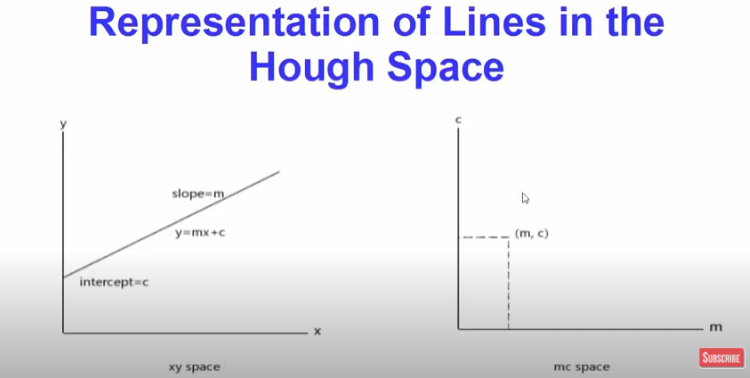

In [71]:
#a line in the xy space is represented as a point in the mc space

cartesian coord system
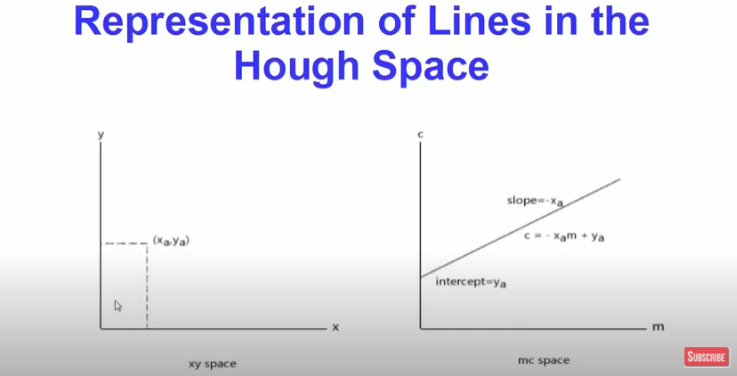

In [72]:
#a point in the xy space is represented as a line in the mc space

cartesian coord system
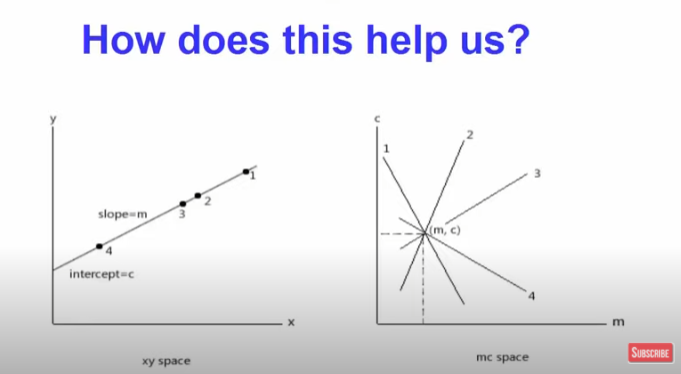

In [73]:
#convert points in the xy space to lines in the mc space
#for ever point defined as an edge on the edge detect image you draw lines in the mc space

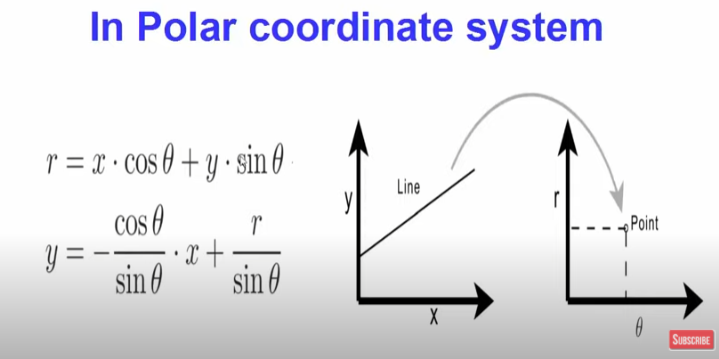

In [74]:
#in the polar coordinate system we can represent a line in x,y space as a point in r,theta space

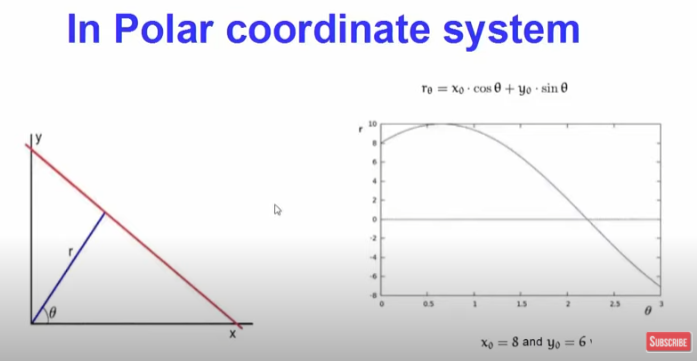
the line representation in hough space taken from the given point in the xy space


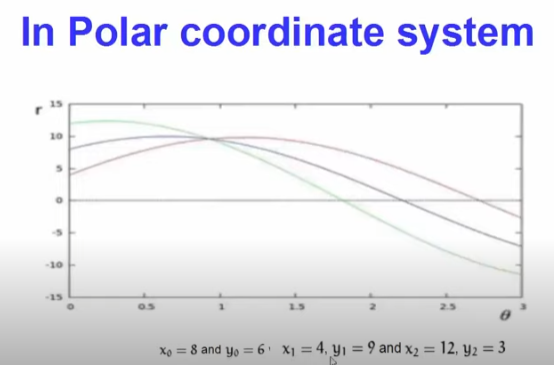

3 points in the xy space are represented as 3 lines in the r,theta space
The point of intersection between the lines in hough space represents a line in xy space

in general we use the polar coord system because the cartesian coordinate system can't represent vertical lines

Hough Transformation Algorithm
1. Edge Detection using canny edge detector
2. mapping of edge points to the Hough Space and storage in an accumulator
3. interpretation of the accumulator to yield lines of infinite lenght. The interpretation is done by thresholding and possibly other constraints
4. conversion of infinite lines to finite lines

Opencv implements two kinds of Hough Line Transforms
1. The Standard Hough Transform (HoughLines method)
2. The Probabilistic Hough Line Transform (HoughLinesP method)

### Hough Line Transform using HoughLines() method

In [75]:
#Hough Transformation Algorithm
#1. Edge Detection using canny edge detector
#2. mapping of edge points to the Hough Space and storage in an accumulator
#3. interpretation of the accumulator to yield lines of infinite lenght. The interpretation is done by thresholding and possibly other constraints
#4. conversion of infinite lines to finite lines

In [119]:
import cv2
import numpy as np

In [161]:
img = cv2.imread('./data/sudoku.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [162]:
#Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])
edges = cv2.Canny(gray, 50,150, apertureSize=3)

In [163]:
#HoughLines(image, rho, theta, threshold[, lines[, srn[, stn[, min_theta[, max_theta]]]]])
#image: source image
#lines: output vector of lines. Each line is represented by a 2 or 3 element vector (rho, theta) or 
#(rho, theta, votes). rho is the distance from the coordinate origin (0,0) (top left corner of image).
#theta is the line rotation angle in radians. votes is the value of accumulator
#rho: distance resolution of the accumulator in pixels
#theta: angle resolution of the accumulator in pixels
#threshold: accumulator threshold param. Only those lines are returned that get enough votes

lines = cv2.HoughLines(edges, 1, np.pi / 180, 200)
print(lines)
#the lines returned are in the polar coordinate system
print(len(lines))

[[[ 3.6100000e+02  1.5707964e+00]]

 [[ 3.5700000e+02  1.5707964e+00]]

 [[ 3.0400000e+02  0.0000000e+00]]

 [[ 4.1200000e+02  1.5707964e+00]]

 [[ 2.1200000e+02  3.4906585e-02]]

 [[ 2.1600000e+02  3.4906585e-02]]

 [[ 2.1600000e+02  1.5707964e+00]]

 [[-3.4900000e+02  3.1241393e+00]]

 [[ 1.6900000e+02  1.5707964e+00]]

 [[ 2.5700000e+02  1.7453292e-02]]

 [[ 2.1200000e+02  1.5707964e+00]]

 [[-3.9300000e+02  3.1066861e+00]]

 [[-4.3600000e+02  3.0892327e+00]]

 [[ 2.6000000e+02  1.7453292e-02]]

 [[ 3.0200000e+02  0.0000000e+00]]

 [[ 8.3000000e+01  8.7266460e-02]]

 [[-3.4500000e+02  3.1241393e+00]]

 [[-4.9700000e+02  3.0717795e+00]]

 [[-4.8400000e+02  3.0717795e+00]]

 [[-3.9100000e+02  3.1066861e+00]]

 [[-4.3900000e+02  3.0892327e+00]]

 [[ 7.9000000e+01  8.7266460e-02]]

 [[ 1.7100000e+02  5.2359879e-02]]

 [[ 4.1000000e+02  1.5707964e+00]]

 [[-4.9100000e+02  3.0717795e+00]]

 [[-5.0300000e+02  3.0717795e+00]]

 [[-5.0900000e+02  3.0717795e+00]]

 [[ 3.1100000e+02  1.5707964

In [151]:
lines[0][0]

array([361.       ,   1.5707964], dtype=float32)

In [152]:
lines[1][0]

array([357.       ,   1.5707964], dtype=float32)

In [153]:
lines[28][0]

array([309.       ,   1.5707964], dtype=float32)

In [158]:
rho_test, theta_test = lines[28][0]
print(rho_test, theta_test)
a_test = np.cos(theta_test)
b_test = np.sin(theta_test)
print(a_test)
print(b_test)
x0_test = a_test*rho_test
y0_test = b_test*rho_test
print(x0_test)
print(y0_test)
x1_test = int(x0_test + 1000 * (-b_test))
y1_test = int(y0_test + 1000 * (a_test))
x2_test = int(x0_test - 1000 * (-b_test))
y2_test = int(y0_test - 1000 * (a_test))
print(x1_test, y1_test, x2_test, y2_test)

cv2.line(img, (x1_test,y1_test), (x2_test,y2_test), (255,255,0), 2)

309.0 1.5707964
-4.371139e-08
1.0
-1.3506819e-05
309.0
-1000 308 999 309


array([[[177, 172, 163],
        [172, 167, 158],
        [173, 166, 157],
        ...,
        [213, 207, 202],
        [213, 207, 202],
        [213, 207, 202]],

       [[176, 171, 162],
        [172, 167, 158],
        [174, 167, 158],
        ...,
        [213, 207, 202],
        [213, 207, 202],
        [213, 207, 202]],

       [[175, 170, 161],
        [171, 166, 157],
        [173, 166, 157],
        ...,
        [213, 207, 202],
        [213, 207, 202],
        [213, 207, 202]],

       ...,

       [[ 45,  45,  45],
        [ 46,  46,  46],
        [ 45,  45,  45],
        ...,
        [138, 136, 136],
        [138, 136, 136],
        [135, 133, 133]],

       [[ 47,  47,  47],
        [ 48,  48,  48],
        [ 47,  47,  47],
        ...,
        [135, 133, 133],
        [135, 133, 133],
        [133, 131, 131]],

       [[ 47,  47,  47],
        [ 48,  48,  48],
        [ 47,  47,  47],
        ...,
        [135, 133, 133],
        [135, 133, 133],
        [133, 131, 131]]

In [164]:
for line in lines:
    #rho is distance from coordinate 0,0 (top left)
    #theta is the line rotation angle in radians
    rho, theta = line[0]
    #convert polar coords into cartesian coords for the line method
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    #x1 stores the rouned off values of (r*cos(theta) - 1000 * sin(theta))
    x1 = int(x0 + 1000 * (-b))
    #y1 stores the rounded off value of (r * sin(theta) + 1000 * cos(theta))
    y1 = int(y0 + 1000 * (a))
    #x2 stores the rounded off value of (r*cos(theta) + 1000 * sin(theta))
    x2 = int(x0 - 1000 * (-b))
    #y2 stores the rounded off value of (r* sin(theta) - 1000 * cos(theta))
    y2 = int(y0 - 1000 * (a))
    cv2.line(img, (x1,y1), (x2,y2), (0,0,255),2)

In [165]:
cv2.imshow('img', img)
cv2.imshow('edges', edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

You can see that the lines draw are infinit. They go from 1 edge to the other and don't stop.
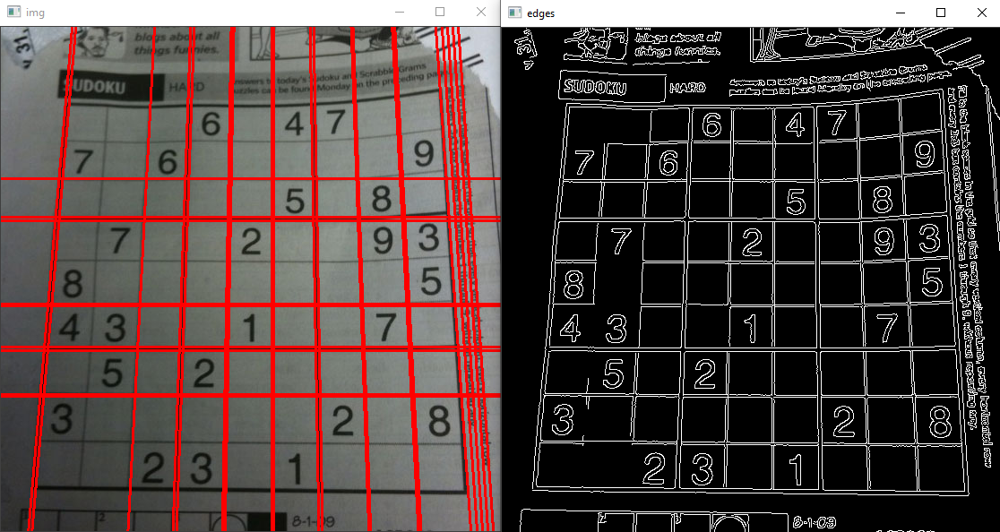
This problem can be solved using the other HoughLineP() method

### Probabilistic Hough Line Transform

In [168]:
import cv2
import numpy as np

In [186]:
img = cv2.imread('./data/sudoku.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [187]:
#Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])
edges = cv2.Canny(gray, 50,150, apertureSize=3)

In [193]:
#HoughLinesP(image, rho, theta, threshold[, lines[, minLineLength[, maxLineGap]]])
#image with edges
#rho Distance resolution of the accumulator in pixels.
#theta Angle resolution of the accumulator in radians.
#threshold Accumulator threshold parameter. Only those lines are returned that get enough
#lines Output vector of lines. Each line is represented by a 4-element vector \f$(x_1, y_1, x_2, y_2)\f$ , where \f$(x_1,y_1)\f$ and \f$(x_2, y_2)\f$ are the ending points of each detectedline segment.
#minLineLength Minimum line length. Line segments shorter than that are rejected.
#maxLineGap Maximum allowed gap between points on the same line to link them.
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength = 100, maxLineGap = 10)

In [176]:
print(len(lines))
print(lines[0])

72
[[175 412 543 412]]


In [194]:
for line in lines:
    #unlike HoughLines(), HoughLinesP() directly provides x1,y1,x2,y2 as output for each line.
    #this is much better because we don't have to do all the extra calculations.
    x1,y1,x2,y2 = line[0]
    cv2.line(img, (x1,y1), (x2,y2), (0,255,255), 2)

In [195]:
cv2.imshow('img', img)
cv2.imshow('edges', edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

Much better Results
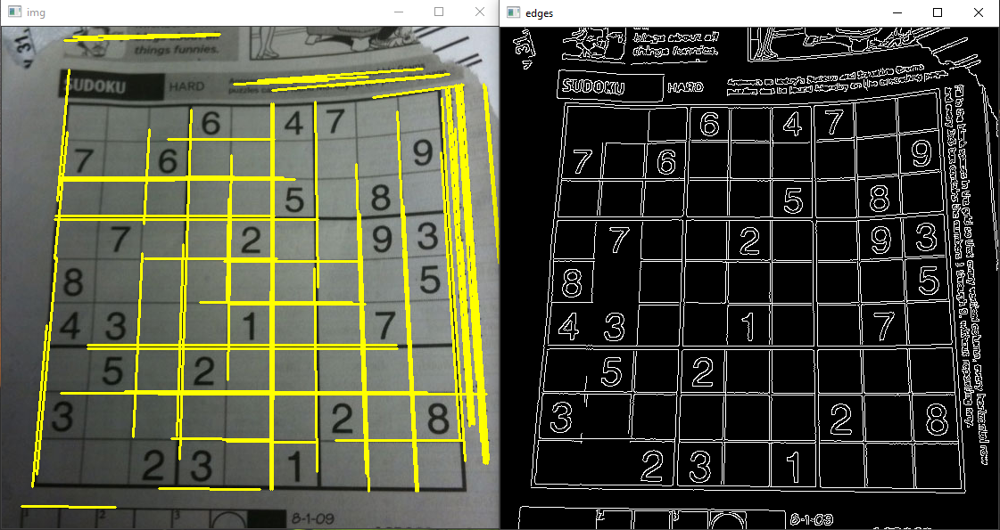

In [ ]:
import cv2
import numpy as np

In [206]:
img = cv2.imread('./data/road.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [207]:
#Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])
edges = cv2.Canny(gray, 50,150, apertureSize=3)

In [208]:
#HoughLinesP(image, rho, theta, threshold[, lines[, minLineLength[, maxLineGap]]])
#image with edges
#rho Distance resolution of the accumulator in pixels.
#theta Angle resolution of the accumulator in radians.
#threshold Accumulator threshold parameter. Only those lines are returned that get enough
#lines Output vector of lines. Each line is represented by a 4-element vector \f$(x_1, y_1, x_2, y_2)\f$ , where \f$(x_1,y_1)\f$ and \f$(x_2, y_2)\f$ are the ending points of each detectedline segment.
#minLineLength Minimum line length. Line segments shorter than that are rejected.
#maxLineGap Maximum allowed gap between points on the same line to link them.
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength = 100, maxLineGap = 10)

In [209]:
for line in lines:
    #unlike HoughLines(), HoughLinesP() directly provides x1,y1,x2,y2 as output for each line.
    #this is much better because we don't have to do all the extra calculations.
    x1,y1,x2,y2 = line[0]
    cv2.line(img, (x1,y1), (x2,y2), (0,255,255), 2)

In [210]:
cv2.imshow('img', img)
cv2.imshow('edges', edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

Need to change params to get better results
Better results can be achieved by setting a region of interest to ignore lines that fall in the background or off the side of the road.
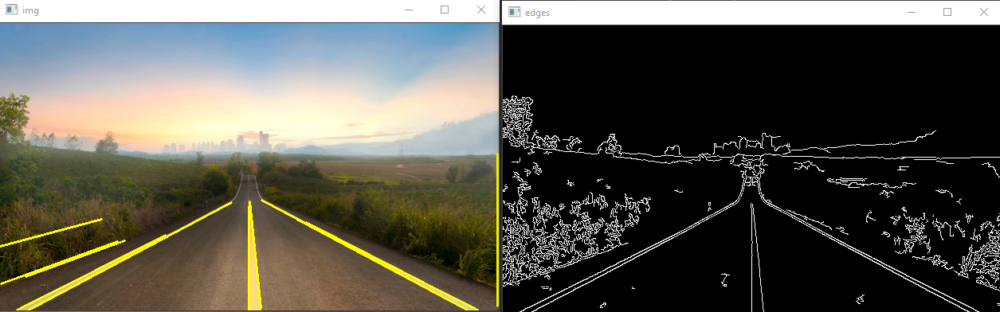

### Road Line Detection Pt 1 and Pt 2

In [25]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

In [180]:
image = cv2.imread('./data/road3.jpeg')
#change color from BGR to RGB for matplotlib to plot
#cvtColor(src, code[, dst[, dstCn]])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [181]:
#find the edges
#cvtColor(src, code[, dst[, dstCn]])
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
#Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])
canny_image = cv2.Canny(gray_image, 100, 200)
#we need to run this before masking the image or the edge detection will pick up the edges
#on the edges of the mask as well.

In [182]:
print(image.shape)

(540, 960, 3)


In [183]:
#define the vertices of the polygon that we want to keep
region_vertices = np.array([(110, 540), (440,320), (530, 320), (960, 540)], np.int32)

In [184]:
#function that will mask out areas we don't want.
def region_of_interest(img, vertices):
    #create 0's in the same size as the img
    mask = np.zeros_like(img)
    #set the masked area to white
    match_mask_color = 255
    #sets the area inside the vertices to all white pixels.
    #fillPoly(img, pts, color[, lineType[, shift[, offset]]])
    cv2.fillPoly(mask, vertices, match_mask_color)
    #crop out the masked part using the bitwise_and function.
    #keeps the area were the images are different which would be the white area.
    #bitwise_and(src1, src2[, dst[, mask]])
    masked_img = cv2.bitwise_and(img, mask)
    return masked_img

In [185]:
#now we will crop the image
cropped_image = region_of_interest(canny_image, [region_vertices])

In [186]:
#use HoughLinesP() to get the lines
#HoughLinesP(image, rho, theta, threshold[, lines[, minLineLength[, maxLineGap]]])
lines = cv2.HoughLinesP(cropped_image, 
                        rho = 6, 
                        theta = np.pi/60, 
                        threshold = 160, 
                        lines = np.array([]),
                        minLineLength = 20, 
                        maxLineGap = 25)
#this returns all the line vectors that are detected

In [187]:
#this returns all the line vectors that are detected
lines

array([[[498, 320, 877, 538]],

       [[506, 322, 531, 336]],

       [[631, 390, 705, 432]],

       [[726, 442, 842, 508]],

       [[589, 367, 658, 406]],

       [[318, 430, 345, 410]],

       [[387, 382, 457, 331]],

       [[506, 323, 812, 500]],

       [[290, 463, 354, 412]],

       [[383, 381, 465, 321]],

       [[823, 496, 899, 539]],

       [[281, 459, 350, 409]]], dtype=int32)

In [203]:
#function that draws the lines
def draw_lines(img, lines):
    img = np.copy(img)
    #create blank image that matches the original image size
    blank_image = np.zeros((img.shape[0], img.shape[1], img.shape[2]), dtype = np.uint8)
    #loop through line vectors
    for i in lines:
        #get the 4 coordinates for each line vector
        for x1,y1,x2,y2 in i:
            #draw the lines onto the blank image
            cv2.line(blank_image, (x1,y1), (x2,y2), (255,0,0), 4)
    
    #merge image with lines with the original image
    #addWeighted(src1, alpha, src2, beta, gamma[, dst[, dtype]])
    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img

In [204]:
#actually draw the lines on the original image using the draw_lines function create above
image_with_lines = draw_lines(image, lines)

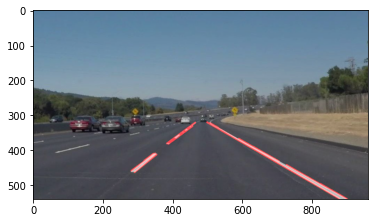

In [205]:
plt.imshow(image_with_lines)
plt.show()

### Road Line Detection Pt 3

In [ ]:
#doing line detection on a video is the same as an image except we just have to run it
#on every single frame of the image

In [2]:
import numpy as np
import cv2

In [3]:
#function that draws the lines
def draw_lines(img, lines):
    img = np.copy(img)
    #create blank image that matches the original image size
    blank_image = np.zeros((img.shape[0], img.shape[1], img.shape[2]), dtype = np.uint8)
    #loop through line vectors
    for i in lines:
        #get the 4 coordinates for each line vector
        for x1,y1,x2,y2 in i:
            #draw the lines onto the blank image
            cv2.line(blank_image, (x1,y1), (x2,y2), (255,0,0), 4)
    
    #merge image with lines with the original image
    #addWeighted(src1, alpha, src2, beta, gamma[, dst[, dtype]])
    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
    return img

In [4]:
#function that will mask out areas we don't want.
def region_of_interest(img, vertices):
    #create 0's in the same size as the img
    mask = np.zeros_like(img)
    #set the masked area to white
    match_mask_color = 255
    #sets the area inside the vertices to all white pixels.
    #fillPoly(img, pts, color[, lineType[, shift[, offset]]])
    cv2.fillPoly(mask, vertices, match_mask_color)
    #crop out the masked part using the bitwise_and function.
    #keeps the area were the images are different which would be the white area.
    #bitwise_and(src1, src2[, dst[, mask]])
    masked_img = cv2.bitwise_and(img, mask)
    return masked_img

In [16]:
def process(image):
    #find the edges
    #cvtColor(src, code[, dst[, dstCn]])
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    #Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]])
    canny_image = cv2.Canny(gray_image, 100, 200)
    #we need to run this before masking the image or the edge detection will pick up the edges
    #on the edges of the mask as well.

    #print(image.shape)

    #define the vertices of the polygon that we want to keep
    region_vertices = np.array([(110, 540), (440,320), (530, 320), (960, 540)], np.int32)

    #now we will crop the image
    cropped_image = region_of_interest(canny_image, [region_vertices])

    #use HoughLinesP() to get the lines
    #HoughLinesP(image, rho, theta, threshold[, lines[, minLineLength[, maxLineGap]]])
    #this returns all the line vectors that are detected
    lines = cv2.HoughLinesP(cropped_image, 
                            rho = 2, 
                            theta = np.pi/60, 
                            threshold = 50, 
                            lines = np.array([]),
                            minLineLength = 20, 
                            maxLineGap = 100)

    #this returns all the line vectors that are detected
    #print(lines)

    #actually draw the lines on the original image using the draw_lines function create above
    image_with_lines = draw_lines(image, lines)
    return image_with_lines

In [17]:
#read the video
cap = cv2.VideoCapture('./data/solidWhiteRight.mp4')
frame_time = 100
while(cap.isOpened()):
    ret, frame = cap.read()

    if ret:
        #run the process function on each frame.
        #this function will return the image with the lines for each frame
        frame = process(frame)
        cv2.imshow('frame',frame)
        #cv2.waitKey(x) where x = number of seconds between a frame
        if cv2.waitKey(frame_time) & 0xFF == ord('q'):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()

### Circle Detection with Hough Circle Transform

In [1]:
import numpy as np
import cv2

In [3]:
img = cv2.imread('./data/smarties.png')
output = img.copy()

In [4]:
print(img.shape)

(356, 413, 3)


(x - x_center)^2 + (y - y_center)^2 = r^2 \
where (x_center, y_center) is the center of the circle, and r is the radius of the circle

In [5]:
#convert to grayscale image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [6]:
#houghcircle() works better with blurred image so we will blur the gray image
#medianBlur(src, ksize[, dst])
blurred = cv2.medianBlur(gray, 5)

In [7]:
#apply houghcircles method to blurred image
#HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]])
circles = cv2.HoughCircles(blurred,
                          cv2.HOUGH_GRADIENT,
                          dp = 1,
                          minDist = 20,
                          param1 = 50,
                          param2 = 30,
                          minRadius = 0,
                          maxRadius = 0)

circles = cv2.HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]]) \
 \
image: 8 bit, single-channel, grayscale input image \
 \
circles: output vector of found circles \
 \
method: detection method, see HoughModes. Currently, the only implemented method is HOUGH_GRADIENT \
 \
dp: Inverse ratio of the accumulator resolution to the image resolution \
 \
minDist: minimum distance between the centers of the detected circles \
 \
param1: first method-specifc param. in case of HOUGH_GRADIENT, it is the higher threshold of the two passed to the canny edge detector. \
 \
param2: Second method-specific param. in case of HOUGH_GRADIENT. it is the accumulator threshold for the circle centers at the detection stage. \
 \
minRadius: minimum circle radius \
 \
maxRadius: maximum circle radius. if <=0, uses the maximum image dimension. if < 0, returns cetners without finding the radius

In [8]:
print(circles)
#returns [x, y, radius]

[[[376.5       81.5       26.6     ]
  [347.5      238.5       26.6     ]
  [293.5      320.5       27.9     ]
  [152.5      271.5       27.1     ]
  [205.5      210.5       26.800001]
  [386.5      169.5       26.4     ]
  [286.5      213.5       25.2     ]
  [ 32.5      230.5       27.5     ]
  [269.5      116.5       25.7     ]
  [ 99.5      259.5       28.1     ]
  [220.5      306.5       27.4     ]
  [134.5      328.5       26.800001]
  [320.5      278.5       67.4     ]]]


In [9]:
#need to turn all values from circles above into ints vs floats
detected_circles = np.uint16(np.around(circles))
print(detected_circles)

[[[376  82  27]
  [348 238  27]
  [294 320  28]
  [152 272  27]
  [206 210  27]
  [386 170  26]
  [286 214  25]
  [ 32 230  28]
  [270 116  26]
  [100 260  28]
  [220 306  27]
  [134 328  27]
  [320 278  67]]]


In [10]:
#loop through detected circles
for x,y,r in detected_circles[0, :]:
    #print(x,y,r)
    #draw the circles
    #circle(img, center, radius, color[, thickness[, lineType[, shift]]])
    cv2.circle(output, (x,y), r, (255,0,0), 2)
    #draw the center point using circle method with th x,y and very small radius.
    cv2.circle(output, (x,y), 1, (0,255,0), 2)
    

In [11]:
cv2.imshow('gray', gray)
cv2.imshow('blurred', blurred)
cv2.imshow('output', output)
cv2.waitKey(0)
cv2.destroyAllWindows()

Works very well except there's 1 random circle thats darw that needs to get taken care of \
It turns out the last poing has a radius of 67.
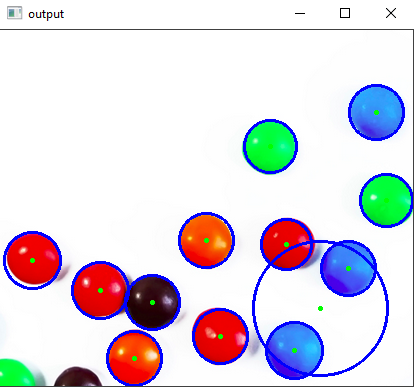

In [2]:
# now we'll do the same for shapes.jpg
shapes = cv2.imread('./data/shapes.jpg')
shapes_output = shapes.copy()

#convert to grayscale image
shapes_gray = cv2.cvtColor(shapes, cv2.COLOR_BGR2GRAY)

#houghcircle() works better with blurred image so we will blur the gray image
#medianBlur(src, ksize[, dst])
shapes_blurred = cv2.medianBlur(shapes_gray, 5)

#apply houghcircles method to blurred image
#HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]])
shapes_circles = cv2.HoughCircles(shapes_blurred,
                          cv2.HOUGH_GRADIENT,
                          dp = 1,
                          minDist = 20,
                          param1 = 50,
                          param2 = 30,
                          minRadius = 0,
                          maxRadius = 0)

print(shapes_circles)

#need to turn all values from circles above into ints vs floats
shapes_detected_circles = np.uint16(np.around(shapes_circles))
print(shapes_detected_circles)

#loop through detected circles
for x,y,r in shapes_detected_circles[0, :]:
    #print(x,y,r)
    #draw the circles
    #circle(img, center, radius, color[, thickness[, lineType[, shift]]])
    cv2.circle(shapes_output, (x,y), r, (255,0,0), 2)
    #draw the center point using circle method with th x,y and very small radius.
    cv2.circle(shapes_output, (x,y), 1, (0,255,0), 2)
    

cv2.imshow('shapes_gray', shapes_gray)
cv2.imshow('shapes_blurred', shapes_blurred)
cv2.imshow('shapes_output', shapes_output)
cv2.waitKey(0)
cv2.destroyAllWindows()

[[[ 65.5      211.5       44.100002]]]
[[[ 66 212  44]]]


The actual cirlce in this image was not a perfect circle so the resutls aren't perfect either
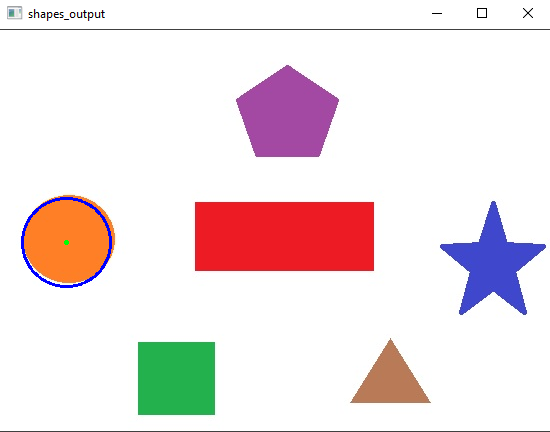

### Face Detecting using Haar Cascade Classifiers Image

Effective object detection method. A machine learning based approach where a cascade function is trained for a lot of positive and negative images. \
 \
First, a classifier (namely a cascade of boosted classifiers workign with haar-like features) is trained with a few hundred sample views of a patricular object (i.e. a face or a car), called positive examples, that are scaled to the same size (say, 20x20), and negative examples - arbitrary images of the same size. \
 \
After the classifier is trained it can be applied to a region of interest of an input image and if it outputs a 1 there's a face otherwise it will output a 0

OpenCV comes with a trainer as well as a detector so you can train your own classifier to detect any object, like a watch or a car. \
 \
Opencv's github page also has some trained classifiers in xml format. \
 \
Since we want to detect faces we will use the haarcascade_fonrtalface_default.xml classifier

In [1]:
import cv2
import numpy as np

In [2]:
#before loading the image we will define the face classifier
face_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_frontalface_default.xml')

In [7]:
#read in the image and since the cascade classifier will work with grayscale image we need to
#convert it to gray
img = cv2.imread('./data/face4.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [8]:
#use the detectMultiScale method on the face_cascade CascadeClassifier object
#detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor = 1.1,
                                     minNeighbors = 4)

objects = cv2.CascadeClassifier.detectMultiScale(image, scaleFactor, minNeighbors) \
 \
objects: Vector of rectangles where each rectangle contains the detected object. The retangles may be partially outisde the original image \
 \
image: matrix of the type CV_8U containing an image where objects are detected. \
 \
 scaleFactor: parameter specifying how much the image size is reduced at each image scale. \
  \
 minNeighbors: param specifying how many neighbors each candidate rectangle should have to retain it. \

In [9]:
#iterate over all the faces we have detected and draw our retangles
for (x,y,w,h) in faces:
    #rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (255,0,255), 2)

In [10]:
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

Works very well
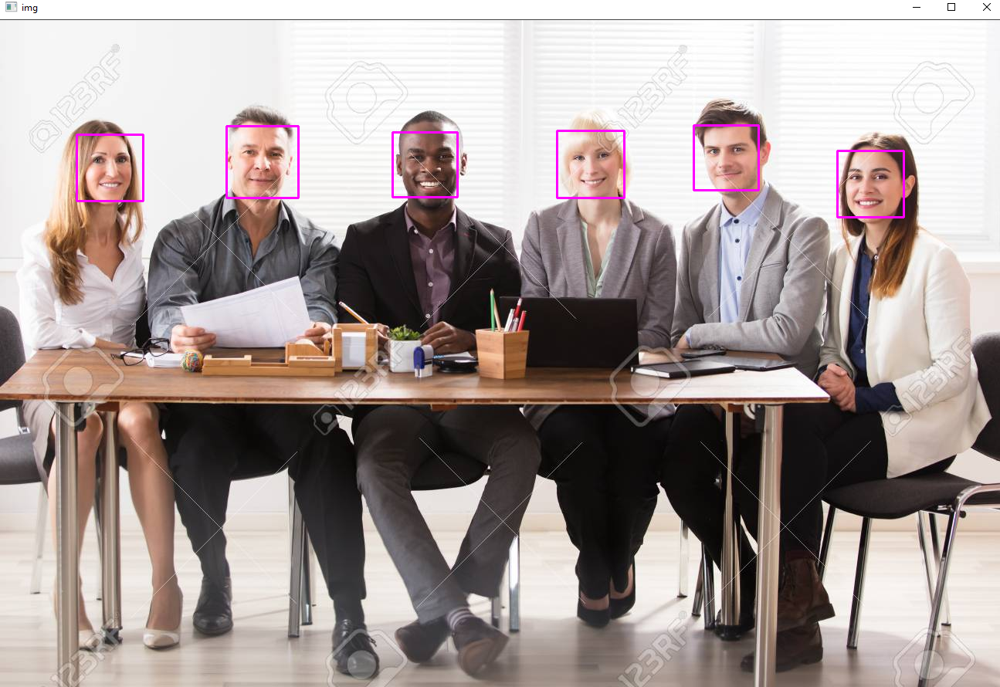

### Face Detecting using Haar Cascade Classifiers Video

In [11]:
#same as doing it for an image we have to do it for every single frame of the video

In [20]:
import cv2
import numpy as np

#before loading the image we will define the face classifier
face_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_frontalface_default.xml')
 
import cv2

cap = cv2.VideoCapture(0)
#print(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
while cap.isOpened():
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    #use the detectMultiScale method on the face_cascade CascadeClassifier object
    #detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    faces = face_cascade.detectMultiScale(gray, 
                                          scaleFactor = 1.1,
                                         minNeighbors = 6)

    #iterate over all the faces we have detected and draw our retangles
    for (x,y,w,h) in faces:
        #rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
        cv2.rectangle(frame, (x,y), (x+w, y+h), (255,0,255), 2)
    
    cv2.imshow('face', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

### Eye Detection using Haar Feature Based Cascade Classifiers Image

Effective object detection method. A machine learning based approach where a cascade function is trained for a lot of positive and negative images. \
 \
First, a classifier (namely a cascade of boosted classifiers workign with haar-like features) is trained with a few hundred sample views of a patricular object (i.e. a face or a car), called positive examples, that are scaled to the same size (say, 20x20), and negative examples - arbitrary images of the same size. \
 \
After the classifier is trained it can be applied to a region of interest of an input image and if it outputs a 1 there's a face otherwise it will output a 0

OpenCV comes with a trainer as well as a detector so you can train your own classifier to detect any object, like a watch or a car. \
 \
Opencv's github page also has some trained classifiers in xml format. \
 \
Since we want to detect eyes we will use the haarcascade_eye_tree_eyeglasses.xml classifier which we will run inside of the face classifier rectangle. This is because eyes will only occur inside a face

In [4]:
import cv2
import numpy as np

In [5]:
#before loading the image we will define the face and eye classifier
face_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_eye_tree_eyeglasses.xml')

In [14]:
#read in the image and since the cascade classifier will work with grayscale image we need to
#convert it to gray
img = cv2.imread('./data/face1.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

objects = cv2.CascadeClassifier.detectMultiScale(image, scaleFactor, minNeighbors) \
 \
objects: Vector of rectangles where each rectangle contains the detected object. The retangles may be partially outisde the original image \
 \
image: matrix of the type CV_8U containing an image where objects are detected. \
 \
 scaleFactor: parameter specifying how much the image size is reduced at each image scale. \
  \
 minNeighbors: param specifying how many neighbors each candidate rectangle should have to retain it. 

In [15]:
#use the detectMultiScale method on the face_cascade CascadeClassifier object
#detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor = 1.1,
                                     minNeighbors = 4)

In [16]:
#iterate over all the faces we have detected and draw our retangles
for (x,y,w,h) in faces:
    #rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (255,0,255), 2)
    #we will set the face rectangle as the roi for the eye classifier.
    roi_color = img[y:y+h, x:x+w]
    roi_gray = gray[y:y+h, x:x+w]
    #use the detectMultiScale method on the eye_cascade CascadeClassifier object within the face rectangle
    #detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    eyes = eye_cascade.detectMultiScale(roi_gray, 
                                          scaleFactor = 1.1,
                                         minNeighbors = 4)
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (0,255,0), 2)

In [17]:
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Eye Detection using Haar Feature Based Cascade Classifiers Video

In [3]:
import cv2
import numpy as np

#before loading the image we will define the face classifier
face_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('./data/haarcascades/haarcascade_eye_tree_eyeglasses.xml')
 
import cv2

cap = cv2.VideoCapture(0)
#print(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
while cap.isOpened():
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    #use the detectMultiScale method on the face_cascade CascadeClassifier object
    #detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    faces = face_cascade.detectMultiScale(gray, 
                                          scaleFactor = 1.1,
                                         minNeighbors = 6)

    #iterate over all the faces we have detected and draw our retangles
    for (x,y,w,h) in faces:
        #rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
        cv2.rectangle(frame, (x,y), (x+w, y+h), (255,0,255), 2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = frame[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex,ey,ew,eh) in eyes:
            cv2.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (0,255,0), 2)
    
    
    cv2.imshow('roi_color', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

### Detect Corners with Harris Corner Detector

a corner is a region in the image wiht large variation in intensity in all directions

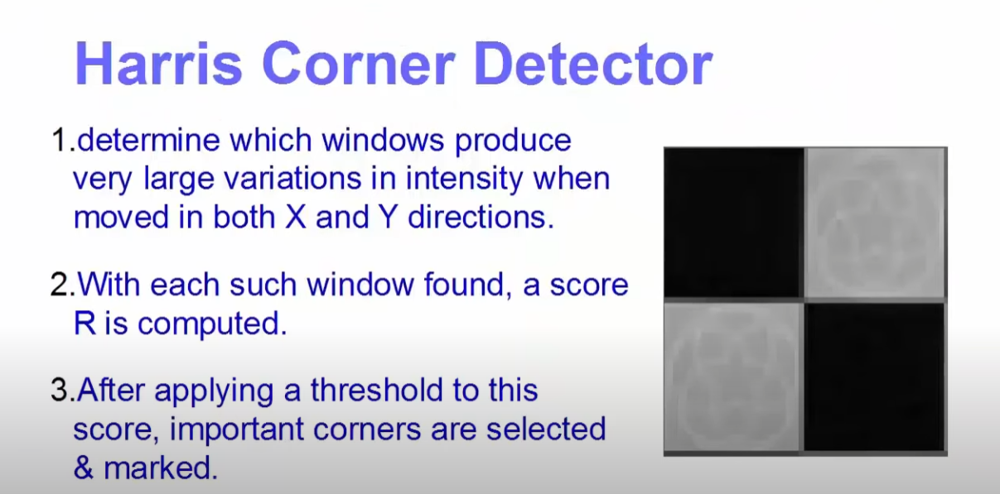

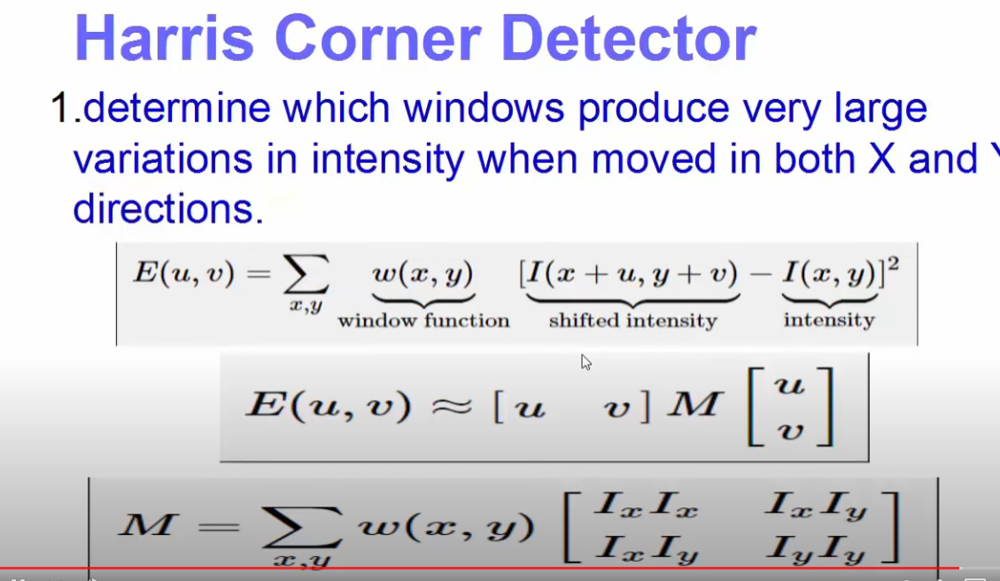

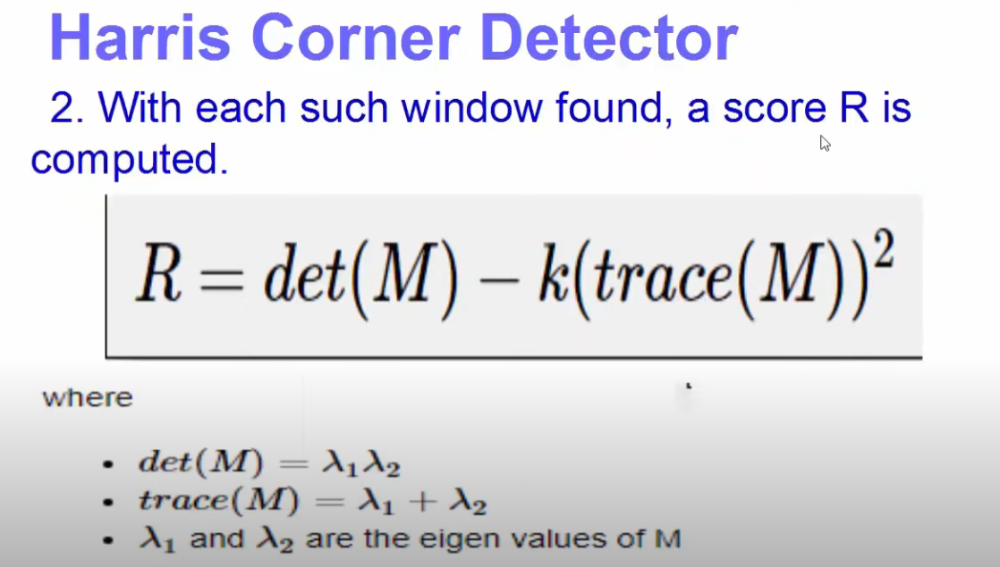

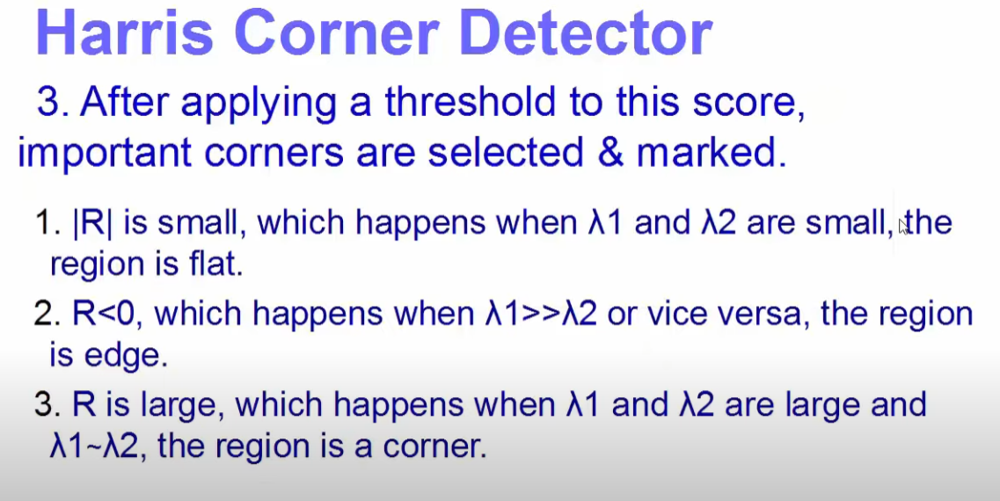

In [1]:
import cv2
import numpy as np

In [10]:
#read in image and convert it to 32 bit gray float
#cornerHarris method needs a 32 bit float grayscale image
img = cv2.imread('./data/chessboard.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

cornerHarris(src, blockSize, ksize, k[, dst[, borderType]]) \
 \
img: input image, it should be grayscale and float32 type \
 \
blocksize: it is the size of the neighborhood considered for corner detection \
 \
ksize: aperture parameter of sobel derivitive used. \
 \
k: harris detector free parameter in the equation.

In [15]:
#plug the float32 gray image in with a blocksize, ksize, and k value
#cornerHarris(src, blockSize, ksize, k[, dst[, borderType]])
dst = cv2.cornerHarris(gray, 2,3,0.04)

In [22]:
#dilate the dst for some reason
dst = cv2.dilate(dst, None)

In [17]:
#revert back to the original image with optimal threshold value and marking all
#corners with red color
img[dst > 0.01 * dst.max()] = [0,0,255]

In [20]:
cv2.imshow('dst', dst)
cv2.waitKey(0)
cv2.destroyAllWindows()

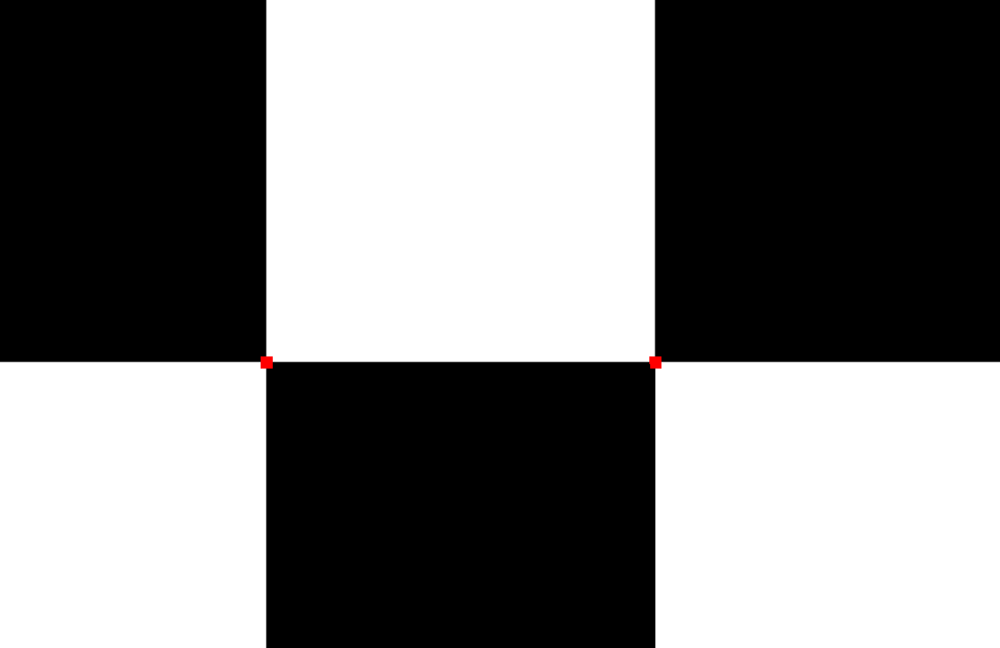

### Detect Corners with Shi Tomasi Corner Detector

In [1]:
import cv2
import numpy as np

In [26]:
#read in image and convert it to grayscale
img = cv2.imread('./data/pic1.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

The Shi Tomasi Detector is similar to the Harris Corner Detector except a difference in the way R is calculated. This method gives a better result than Harris Corner Detector \
 \
We can also define how many corners we want returns which can be useful 

In [27]:
#pass the gray image into the Shi Tomasi goodFeaturesToTrack method
#goodFeaturesToTrack(image, maxCorners, qualityLevel, minDistance[, corners[, mask[, blockSize[, useHarrisDetector[, k]]]]])
#only 25 corners are detected. Set this to 0 to detect all the corners.
corners = cv2.goodFeaturesToTrack(gray, 25, 0.01, 10)
print(corners)
#returns a array of arrays in float format.

[[[103. 232.]]

 [[103. 184.]]

 [[103. 171.]]

 [[231. 128.]]

 [[ 43. 128.]]

 [[231.  25.]]

 [[ 43.  25.]]

 [[ 90. 234.]]

 [[314. 183.]]

 [[ 90. 148.]]

 [[252.  87.]]

 [[377. 207.]]

 [[386. 136.]]

 [[244. 206.]]

 [[323.  41.]]]


In [28]:
#since the goodFeaturesToTrack returns an array of floats we need to convert it to an array of ints
corners = np.int0(corners)
print(corners)

[[[103 232]]

 [[103 184]]

 [[103 171]]

 [[231 128]]

 [[ 43 128]]

 [[231  25]]

 [[ 43  25]]

 [[ 90 234]]

 [[314 183]]

 [[ 90 148]]

 [[252  87]]

 [[377 207]]

 [[386 136]]

 [[244 206]]

 [[323  41]]]


In [31]:
#iterate throught the corners
for i in corners:
    #find values of x and y
    x,y = i.ravel()
    #draw a filled in circle with on the x,y cordinates with a 3 pixel radius
    cv2.circle(img, (x,y), 3, 255, -1)

In [30]:
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

With the number of corners set to 25 and quality level set to 0.01 and minDist to 10 we get
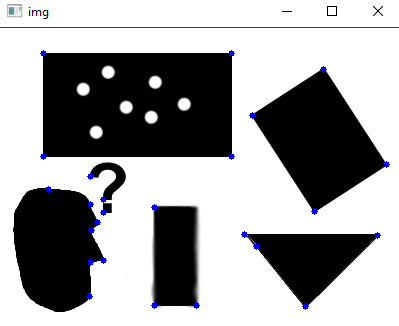

When we set max number of corners to 0 it will detect all the corners with a quality level above 0.01 and minDist = 10
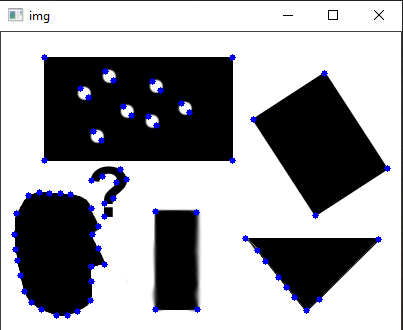

Also when we set max num of corners to 0 and quality level to 0.5 and minDist = 10 we get fewer corners yet
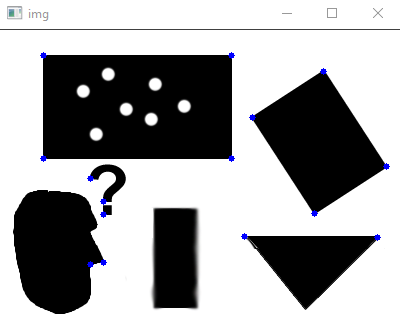

Comparison between Shi Tomasi detector and Harris detector
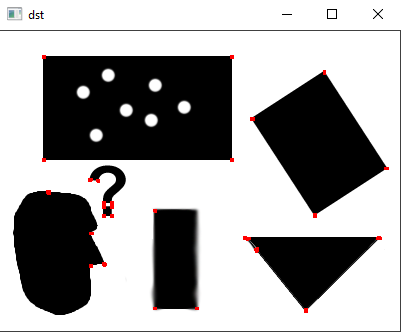
Shi Tomasi gives better results and we can control the number of corners

### How to Use Backgroun Subtraction Methods

Background subtraction is common and widely used technique for generating the foreground mask which is also known as the binary image containing the pixels belonging to the moving object of a scene when these images are captured using a static camera.
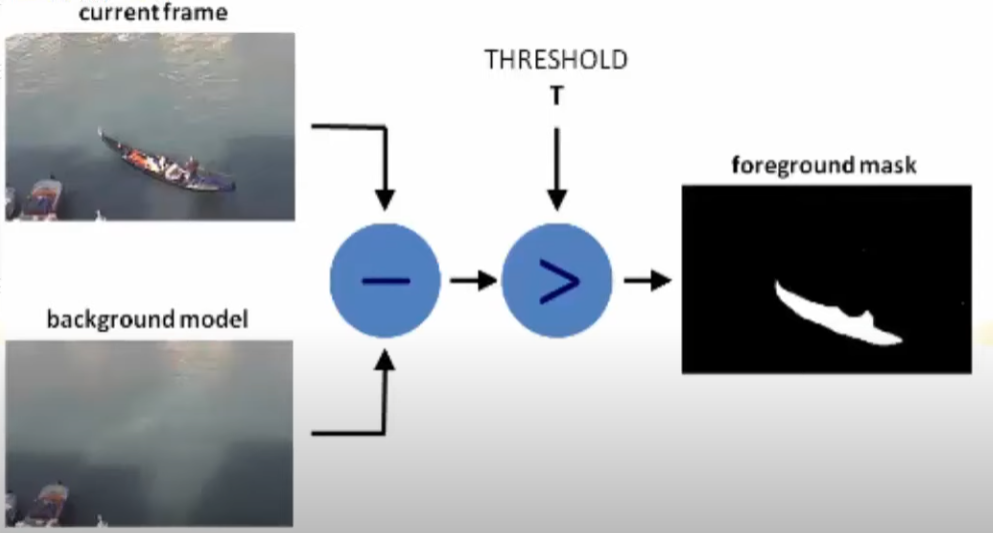

(creates a mask for the thing that's changed from 1 scene to another)

e.g. static traffic camera that wants to count the number of cars who've driven through an area or to detect the number of people in a camera view

Options for the background subtractor are: \
cv2.bgsegm.createBackgroundSubtractorMOG() \
 \
cv2.createBackgroundSubtractorMOG2() \
 \
cv2.bgsegm.createBackgroundSubtractorGMG() \
 \
cv2.createBackgroundSubtractorKNN() \
 \
cv2.bgsegm.createBackgroundSubtractorCNT() \
 \
cv2.bgsegm.createBackgroundSubtractorGSOC() \
 \
cv2.bgsegm.createBackgroundSubtractorLSBP() 


In [40]:
import numpy as np
import cv2

In [41]:
#rean in the capture vidoe
cap = cv2.VideoCapture('./data/vtest.avi')

In [44]:
#here we'll create a bunch of variables that are different background subtractor methods

#createBackgroundSubtractorMOG([, history[, nmixtures[, backgroundRatio[, noiseSigma]]]])
#gaussian mixture based background and foreground segmentation algorithm 
MOG = cv2.bgsegm.createBackgroundSubtractorMOG() #all the params for this are set by default

#createBackgroundSubtractorMOG2([, history[, varThreshold[, detectShadows]]])
#gaussian mixture based background and foreground segmentation algorithm 
#MOG2 has a parameter to detect shadows, unlike MOG()
MOG2 = cv2.createBackgroundSubtractorMOG2(detectShadows = True)

#createBackgroundSubtractorGMG([, initializationFrames[, decisionThreshold]])
#combines statistical background image estimation and pre-pixel biasing segmentation 
GMG = cv2.bgsegm.createBackgroundSubtractorGMG()
#kernel that will be used in GMG
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

#createBackgroundSubtractorKNN([, history[, dist2Threshold[, detectShadows]]])
KNN = cv2.createBackgroundSubtractorKNN(detectShadows = True)

In [45]:

while True:
    ret, frame = cap.read()
    if frame is None:
        break
    
    #create the foreground mask to the frame
    fgmask = MOG.apply(frame)
    
    fgmask2 = MOG2.apply(frame)
    
    fgmask3 = GMG.apply(frame)
    #apply morphological opening to the GMG background image
    fgmask3 = cv2.morphologyEx(fgmask3, cv2.MORPH_OPEN, kernel)
    
    fgmask4 = KNN.apply(frame)
    
    
    cv2.imshow('frame', frame)
    cv2.imshow('MOG', fgmask)
    cv2.imshow('MOG2', fgmask2)
    cv2.imshow('GMG', fgmask3)
    cv2.imshow('KNN', fgmask4)
    
    keyboard = cv2.waitKey(30)
    if keyboard == 'q' or keyboard == 27:
        break

cap.release()
cv2.destroyAllWindows()

fgbg    cv2.bgsegm.createBackgroundSubtractorMOG() reutrns an image like this for every frame
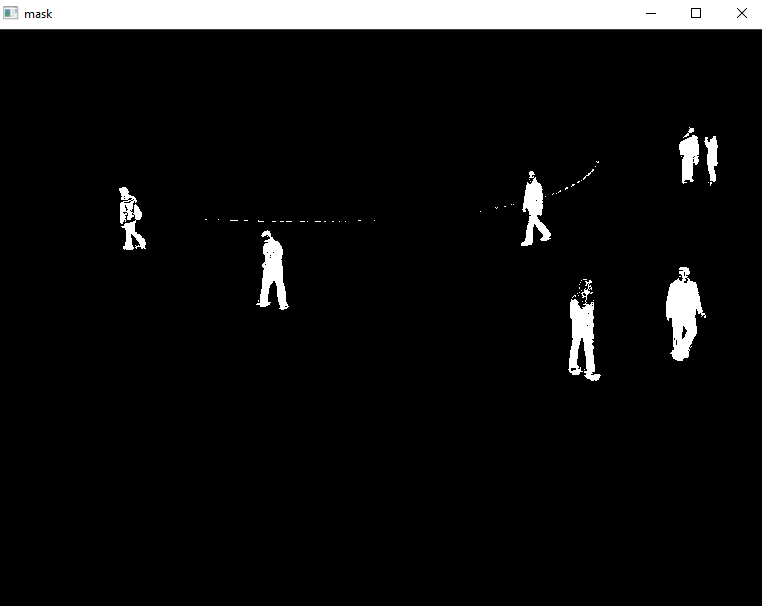
It works pretty well and there is only a little bit of background noise

MOG2 has the option of detecting shadows as well
MOG2 has much more noise with the default params
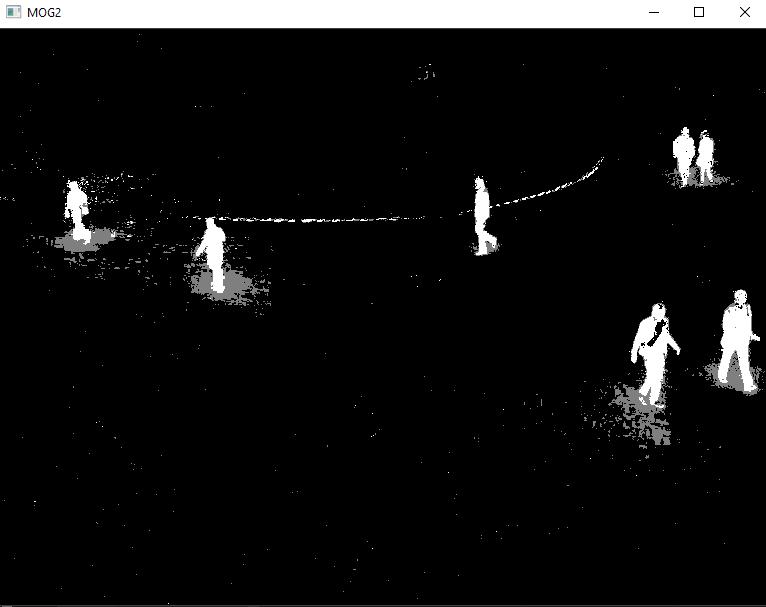

GMG has really bad results so we need to apply morphological opening to the result
without morphological opening
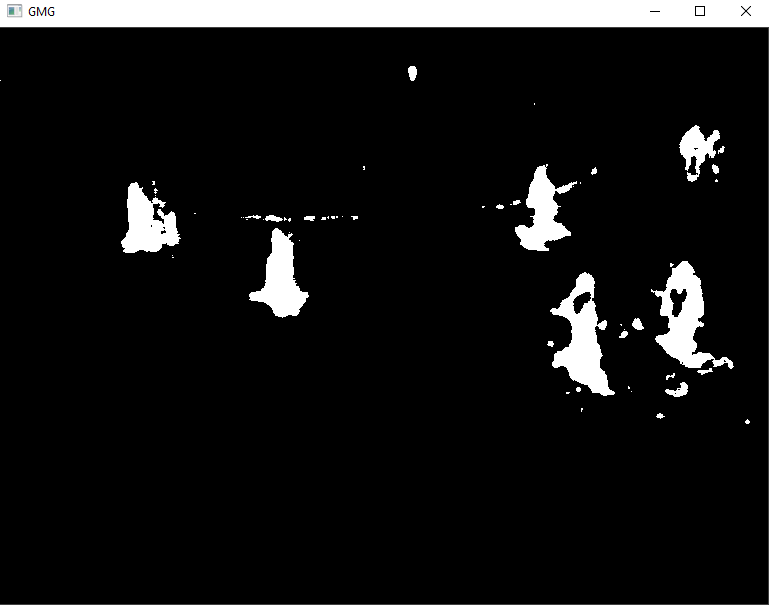
with morphological opening
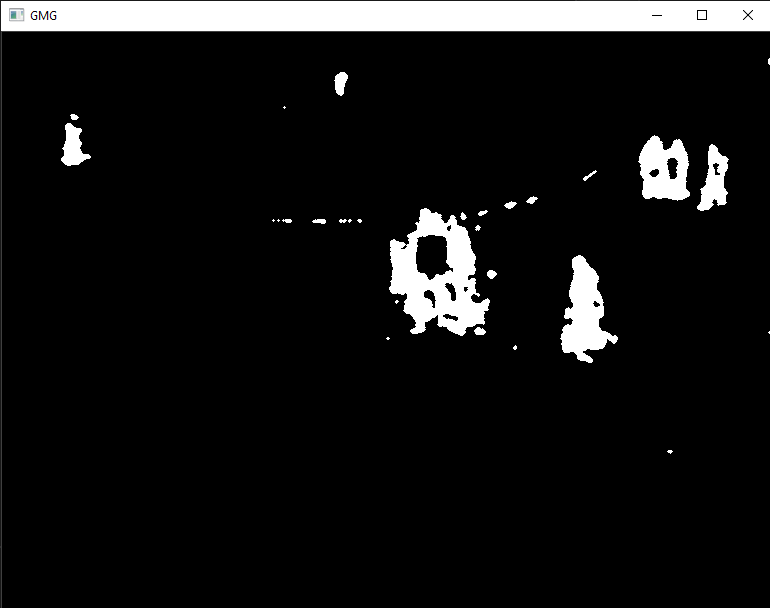

KNN gives pretty good results too.
Also shows shadows as gray pixels
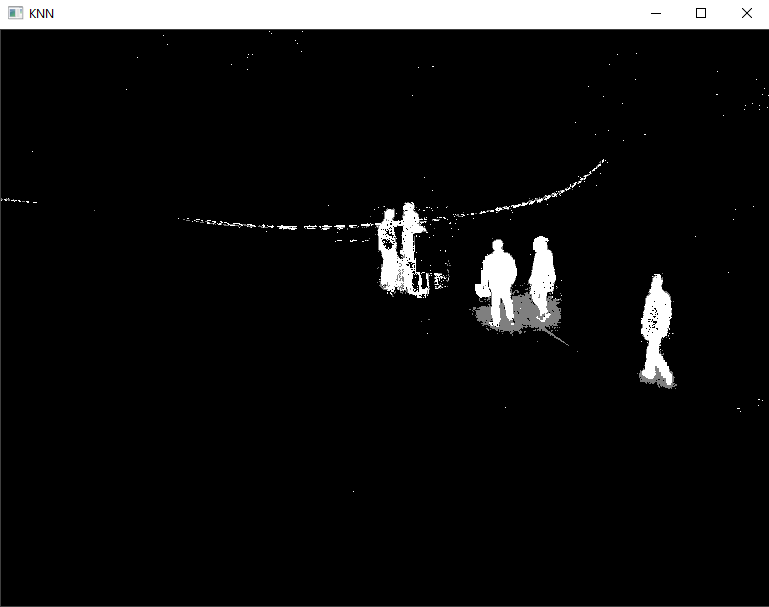

### Mean Shift Object Tracking

object tracking is the process of locating a moving object over time using a camera.

The idea behind mean shift is to locate the densest point within a window. Then create a new window around that point. Then recalculate the densest point within that new window. Then create a new window around that point, etc, etc, until the the densest point/window location doesn't move.  (Similar concept to the idea behind k-means clustering)
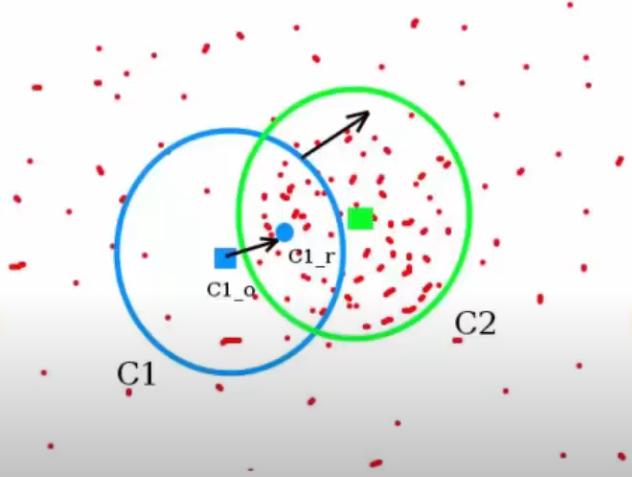

histogram back projection creates an image of the same size but of a single channel of our input image (frame) where each pixel corresponds to the probability of that pixel belonging to our object.

In [36]:
import numpy as np
import cv2

In [49]:
cap = cv2.VideoCapture('./data/highway.mp4')

In [50]:
print(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

856.0
474.0


In [51]:
#take the first frame of the video
ret, frame = cap.read()

#setup initial location of window
x,y,width,height = 460, 175, 50, 40
track_window = (x,y,width, height)

#define histogram back projection
#set up the ROI for tracking
roi = frame[y:y+height, x:x+width]
#convert roi to hsv color space
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
#calculate mask
mask = cv2.inRange(hsv_roi, np.array((0., 60., 32.)), np.array((180., 255., 255.)))
#calculate histogram values
roi_hist = cv2.calcHist([hsv_roi], [0], mask, [180], [0,180])
#normalize hist values
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)


#setup the termination criteria, either 10 iterations or move by at least 1 point
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)


while(1):
    ret,frame = cap.read()
    if ret == True:
        #convert the frame to hsv
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        #calculate back projected image
        dst = cv2.calcBackProject([hsv], [0], roi_hist, [0,180], 1)
        #apply mean shift to get the new location
        ret, track_window = cv2.meanShift(dst, track_window, term_crit)
        #draw it on image
        x,y,w,h = track_window
        final_image = cv2.rectangle(frame, (x,y), (x+w, y+h), (255,255,0), 2)
        
        cv2.imshow('final_image', final_image)
        cv2.imshow('back projected', dst)
        if cv2.waitKey(100) & 0xFF == ord('q'):
            break
    else:
        break
        
cap.release()
cv2.destroyAllWindows()

Limitations:
1. The size of the window doesn't change.
2. We have to know the starting point for the window

### Camshift Object Tracking

Continuously Adaptive Mean Shift

 \
 starts by applying mean shift but once the window converges it updates the size of the window

In [1]:
import numpy as np
import cv2

In [7]:
cap = cv2.VideoCapture('./data/highway.mp4')

#take the first frame of the video
ret, frame = cap.read()

#setup initial location of window
x,y,width,height = 460, 175, 50, 40
track_window = (x,y,width, height)

#define histogram back projection
#set up the ROI for tracking
roi = frame[y:y+height, x:x+width]
#convert roi to hsv color space
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
#calculate mask
mask = cv2.inRange(hsv_roi, np.array((0., 60., 32.)), np.array((180., 255., 255.)))
#calculate histogram values
roi_hist = cv2.calcHist([hsv_roi], [0], mask, [180], [0,180])
#normalize hist values
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)


#setup the termination criteria, either 10 iterations or move by at least 1 point
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)


while(1):
    ret,frame = cap.read()
    if ret == True:
        #convert the frame to hsv
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        #calculate back projected image
        dst = cv2.calcBackProject([hsv], [0], roi_hist, [0,180], 1)
        #apply mean shift to get the new location
        ret, track_window = cv2.CamShift(dst, track_window, term_crit)
        #draw it on image
        pts = cv2.boxPoints(ret)
        #convert pts into integer
        pts = np.int0(pts)
        #draw the points
        final_image = cv2.polylines(frame, [pts], True, (255,0,255), 2)
        cv2.imshow('final_image', final_image)
        cv2.imshow('back projected', dst)
        if cv2.waitKey(100) & 0xFF == ord('q'):
            break
    else:
        break
        
cap.release()
cv2.destroyAllWindows()

This gives shitty results but I used a different image so I'm not surprized that the same params don't work for this video.